<a href="https://colab.research.google.com/github/momowade221/Notebook_Segmentation_Client_OM/blob/main/OM_Segmentation_client_OM_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CONFIGURATION**

---



In [2]:
!pip install pyspark
# !pip install squarify
# !pip install lifetimes
# !pip install kmodes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425345 sha256=52f339d91b11ba8803eee4fca48aa46ebc04eb90aada35c3a31c521f6628a429
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [ ]:
import sys
print(sys.version)

3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


In [3]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Colab/Segmentation/
myPath='/content/drive/MyDrive/Colab/Segmentation/#datasets_OM'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from pyspark.sql import SparkSession
from pyspark.sql import DataFrame
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.sql.window import *
from pyspark.ml.feature import *
from pyspark.ml import *
from pyspark.ml.clustering import *
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.column import Column


import sklearn
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors as mcolors
from scipy.stats import linregress
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score, adjusted_rand_score
from sklearn.cluster import KMeans
from tabulate import tabulate
from collections import Counter

spark = SparkSession.builder.appName("Transactions_OM").getOrCreate()
# Configuration pour permettre l'analyse des dates au format Legacy
# spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
spark

Mounted at /content/drive
/content/drive/MyDrive/Colab/Segmentation


In [ ]:
print(sklearn.__version__)

# **PRÉPARATION DES DONNÉES**

---



## **Collection des données**

In [4]:
#Selection des données sur Hive
""" SELECT * FROM `trusted_om`.`base_transaction_om` WHERE day >= '20230801' AND day <= '20230831'
 ORDER BY RAND() LIMIT 100000; """

" SELECT * FROM `trusted_om`.`base_transaction_om` WHERE day >= '20230801' AND day <= '20230831'\n ORDER BY RAND() LIMIT 100000; "

In [5]:
# #Importation des CSV
# path='/content/drive/MyDrive/Colab/Segmentation/#datasets_OM'
# file_list=['2022_2.csv', '2022_3.csv','2022_4.csv','2022_5.csv','2022_6.csv','2022_7.csv',  '2022_8.csv', '2022_8.csv','2022_9.csv','2022_10.csv','2022_11.csv','2022_12.csv','2023_1.csv','2023_2.csv','2023_3.csv','2023_4.csv','2023_5.csv','2023_6.csv','2023_7.csv', ]
# df_agg = spark.read.csv(f'{path}/2022_1.csv', header=True)
# for csv_file in file_list:x
#   df = spark.read.csv(f'{path}/{csv_file}', header=True, inferSchema=True)
#   df_agg = df_agg.union(df)

# df_agg.write.csv('#datasets_OM/trusted_om.base_transaction.csv', header=True, mode='overwrite')
# df_agg.toPandas().to_csv('#datasets_OM/trusted_om.transactions.csv', index=False)
# # Show the RFM DataFrame
# df_agg.show()

In [6]:
def df_load(path, table):
    # Charger le DataFrame depuis le fichier CSV avec les colonnes existantes
    df_loaded= spark.read.csv(f'{path}', header=True)
    # BaseTransaction OM - Renommer les colonnes
    new_column_names = [col_name.replace(f"{table}.", "") for col_name in df_loaded.columns]
    df_loaded = df_loaded.toDF(*new_column_names)
    return df_loaded


def pd_load(path, table):
    # Charger le DataFrame depuis le fichier CSV avec les colonnes existantes
    pd_loaded = pd.read_csv(path)
    # Renommer les colonnes
    pd_loaded.columns = [col.replace(f"{table}.", "") for col in pd_loaded.columns]
    return pd_loaded

#OM
df_transaction_om = df_load(f'{myPath}/base_transaction_om_merge.csv', "base_transaction_om")
pd_transaction_om = pd_load(f'{myPath}/base_transaction_om_merge.csv', "base_transaction_om")
#OEM
df_transaction_oem=df_load(f'{myPath}/base_transaction_oem.csv',"base_transaction_oem")

#Transactions_OM
df_transactions=df_load(f'{myPath}/trusted_om.transactions.csv',"transactions")

#Redefined reporting
df_segment_recharge=df_load(f'{myPath}/refined_reporting.segment_recharge.csv',"segment_recharge")
pd_segment_recharge=pd_load(f'{myPath}/refined_reporting.segment_recharge.csv',"segment_recharge")

#SICO
df_sico=df_load(f'{myPath}/trusted_sicli.sico.csv',"sico")
pd_sico = pd_load(f'{myPath}/trusted_sicli.sico.csv',"sico")

#Segment palier
df_segment_palier=df_load(f'{myPath}/segment_palier.csv',"")

#Localisaion
df_localisation=df_load(f'{myPath}/localisation.csv', 'location_day')
pd_localisation=pd_load(f'{myPath}/localisation.csv', 'location_day')

<ipython-input-6-e5deed3cea6a>:12: DtypeWarning: Columns (12,13,14,15,20) have mixed types. Specify dtype option on import or set low_memory=False.
  pd_loaded = pd.read_csv(path)
<ipython-input-6-e5deed3cea6a>:12: DtypeWarning: Columns (13,14,15,16,33) have mixed types. Specify dtype option on import or set low_memory=False.
  pd_loaded = pd.read_csv(path)


## **Exploration des données**

---



### Définition des fonctions d'exploration

In [ ]:
def df_info(df: DataFrame):
   # Informations sur le schéma du DataFrame
   ############ Info ###########")
   df.printSchema()

   # Noms des colonnes
   ############ Colonnes ###########")
   print(df.columns)

   # Dimensions (nombre de lignes et de colonnes)
   ############ Dimensions ###########")
   num_rows = df.count()
   num_cols = len(df.columns)
   print(f"\n \n  Nombre de lignes : {num_rows}, Nombre de colonnes : {num_cols}")

   # Afficher les premières lignes (les 5 premières lignes sans troncature)
   ############ Premières lignes ###########")
   df.show(5, truncate=False)  # Affiche les 5 premières lignes sans troncature

   # Afficher les dernières lignes (les 5 dernières lignes triées par la première colonne en ordre décroissant)
   print("\n########### Dernières lignes ###########")
   df.orderBy(df.columns[0], ascending=False).show(5, truncate=False)  # Affiche les 5 dernières lignes

   # Statistiques sommaires (quantiles) du DataFram
   print("\n########### Statistiques sommaires ###########")
   df.summary().show()


def df_info_detailed(df:DataFrame):
  df_info(df)

  # Données manquantes (NA)
  print("\n########### Données manquantes ###########")
  # Compter le nombre de valeurs manquantes (NA) par colonne
  count_NA = df.agg(*[sum(df[c].isNull().cast("int")).alias(c) for c in df.columns])
  # Afficher le résultat
  print("Le nombre de colonnes qui contiennent des valeurs manquantes (NA)")
  count_NA.show()

  # Compter les occurrences de "NULL" dans chaque colonne
  count_exprs = [expr(f"sum(case when {c} like '%NULL%' then 1 else 0 end) as {c}_count") for c in df.columns]
  print("Le nombre de lignes qui contiennent la chaîne 'NULL'")
  count_NULL = df.select(*count_exprs)
  count_NULL.show()

  # Données dupliquées
  print("\n########### Données dupliquées ###########")

  # Find rows where all column values are identical
  duplicate_rows=df.groupBy(*df.columns).agg(count("*").alias("count"))
  duplicate_rows = duplicate_rows.filter(duplicate_rows["count"] > 1).select(*df.columns)

  if duplicate_rows.count()==0:
    print("Aucune ligne dupliquée trouvée")
  else:
    print(f"Nombre de données dupliquées : {duplicate_rows.count()}")
    # Show the rows with identical value
    duplicate_rows.show()

#Fonction pour afficher un DataFrame PySpark sous forme de Pandas DataFrame
def printdf(df):
    return df.toPandas()


In [ ]:
import pandas as pd

# Fonction pour afficher des informations sur un DataFrame Pandas
def df_info_pandas(df):

    df=df.toPandas()
    # Informations sur le schéma du DataFrame
    print("########### Info ###########")
    df.dtypes

    # Noms des colonnes
    print("########### Colonnes ###########")
    df.columns

    # Dimensions (nombre de lignes et de colonnes)
    print("########### Dimensions ###########")
    num_rows, num_cols = df.shape
    print(f"\n \n  Nombre de lignes : {num_rows}, Nombre de colonnes : {num_cols}")

    # Afficher les premières lignes (les 5 premières lignes)
    print("########### Premières lignes ###########")
    df.head()

    # Afficher les dernières lignes (les 5 dernières lignes)
    print("########### Dernières lignes ###########")
    df.tail()

    # Statistiques sommaires (descriptives) du DataFrame
    print("\n########### Statistiques sommaires ###########")
    df.describe()

# Fonction pour afficher des informations détaillées sur un DataFrame Pandas
def df_info_detailed_pandas(df):
    df_info_pandas(df)

    # Données manquantes (NA)
    print("\n########### Données manquantes ###########")
    # Compter le nombre de valeurs manquantes (NA) par colonne
    missing_data = df.isnull().sum()
    print("Nombre de valeurs manquantes par colonne :")
    print(missing_data)

    # Compter les occurrences de "NULL" dans chaque colonne
    count_NULL = df.apply(lambda col: col.str.contains('NULL').sum())
    print("Nombre d'occurrences de 'NULL' par colonne :")
    print(count_NULL)

    # Données dupliquées
    print("\n########### Données dupliquées ###########")
    duplicate_rows = df[df.duplicated(keep=False)]

    if duplicate_rows.shape[0] == 0:
        print("Aucune ligne dupliquée trouvée")
    else:
        print(f"Nombre de données dupliquées : {duplicate_rows.shape[0]}")
        print("Lignes avec données dupliquées :")
        print(duplicate_rows)

# Fonction pour afficher un DataFrame Pandas
def printdf_pandas(df):
    return df


In [ ]:
# from pyspark.sql import functions as F
def df_colonne_info(df: DataFrame, colonne):
    # Nombre de valeurs distinctes dans la colonne
    colonne_count = df.select(colonne).distinct().count()

    # Récupérer le type de données de la colonne
    colonne_type = df.schema[colonne].dataType

    # Affichage des informations
    print(f" *****Informations sur la colonne ___{colonne}___: *****")
    # Valeurs distinctes de la colonne
    print(f"Les valeurs distinctes sont:")
    df.select(colonne).distinct().show(truncate=False)

    print(f"Nombre de valeurs distinctes : {colonne_count}")

    if isinstance(colonne_type, (FloatType,DecimalType, IntegerType)):
        # Statistiques de base sur la colonne (moyenne, écart type, minimum, maximum)
        mean = df.select(mean(colonne)).first()[0]
        stddev = df.select(stddev(colonne)).first()[0]
        min_value = df.select(min(colonne)).first()[0]
        max_value = df.select(max(colonne)).first()[0]

        # Somme des valeurs dans la colonne
        sum_value = df.select(sum(colonne)).first()[0]

        # Médiane de la colonne
        median = df.approxQuantile(colonne, [0.5], 0.01)[0]

        # 1er quartile (Q1) et 3e quartile (Q3)
        quartiles = df.approxQuantile(colonne, [0.25, 0.75], 0.01)
        q1, q3 = quartiles

        print(f"Valeur moyenne : {mean}")
        print(f"Écart type : {stddev}")
        print(f"Valeur minimale : {min_value}")
        print(f"Valeur maximale : {max_value}")
        print(f"Somme des valeurs : {sum_value}")
        print(f"Médiane : {median}")
        print(f"1er quartile (Q1) : {q1}")
        print(f"3e quartile (Q3) : {q3}")
    else:
        print("Les calculs statistiques ne sont pas applicables car le type de données n'est pas numérique.")

    print("-------------------------------------------------------")


In [ ]:
def plot_colonne_distribution(data, colonne):
    fig, ax = plt.subplots(1, 1, figsize=(20, 8))
    sns.set(style="whitegrid")

    custom_palette = sns.color_palette("husl")

    sns.countplot(x=colonne, data=data, palette=custom_palette)

    total_count = len(data)

    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total_count)
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

    ax.set_ylabel('Nombre de clients')
    ax.set_title(f"Répartition des clients par {column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.tick_params(axis='both', labelsize=14)

    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_colonne_heatmap(data, colonne):
    # Comptez le nombre total de clients
    total_count = len(data)

    # Créez un DataFrame de fréquence des valeurs dans la colonne
    value_counts = data[colonne].value_counts().reset_index()
    value_counts.columns = [colonne, "Count"]

    # Créez un pivot table pour préparer les données au format heatmap
    pivot_table = value_counts.pivot_table(index=None, columns=colonne, values="Count", aggfunc="sum", fill_value=0)

    # Convertissez les valeurs en pourcentage par rapport au total
    pivot_table_percentage = (pivot_table / total_count) * 100

    fig, ax = plt.subplots(figsize=(15, 8))
    sns.set(style="whitegrid")

    # Utilisez la fonction heatmap de Seaborn pour afficher le tableau heatmap en pourcentage
    sns.heatmap(pivot_table_percentage, annot=True, fmt=".1f", cmap="YlGnBu", cbar=False)

    ax.set_xlabel(colonne)
    ax.set_ylabel("Pourcentage de clients")
    ax.set_title(f"Répartition des clients par {colonne} en pourcentage")

    plt.show()

### Exploration de la table **Base_transaction_OM**

In [ ]:
df_info(df_transaction_om)

root
 |-- msisdn: string (nullable = true)
 |-- destinataire: string (nullable = true)
 |-- channel: string (nullable = true)
 |-- date: string (nullable = true)
 |-- description: string (nullable = true)
 |-- fees: string (nullable = true)
 |-- montant: string (nullable = true)
 |-- operation: string (nullable = true)
 |-- status: string (nullable = true)
 |-- statuscode: string (nullable = true)
 |-- titre: string (nullable = true)
 |-- transactionid: string (nullable = true)
 |-- typetransaction: string (nullable = true)
 |-- ingest_date: string (nullable = true)
 |-- year: string (nullable = true)
 |-- month: string (nullable = true)
 |-- day: string (nullable = true)

['msisdn', 'destinataire', 'channel', 'date', 'description', 'fees', 'montant', 'operation', 'status', 'statuscode', 'titre', 'transactionid', 'typetransaction', 'ingest_date', 'year', 'month', 'day']

 
  Nombre de lignes : 3970000, Nombre de colonnes : 17
+-------+---------------------------------------------------

In [ ]:
import pandas as pd


# Define the table name (similar to your "table" variable in Spark)
table = 'base_transaction_om'
df=pd_transaction_om
# Remove the table name prefix and create new column names
new_column_names = [col_name.replace(f"{table}.", "") for col_name in df.columns]

# Rename the columns in the DataFrame
df= df.rename(columns=dict(zip(df.columns, new_column_names)))

# Exclude specific columns from the summary
columns_to_exclude = ["destinataire", "ingest_date", "month", "year","day", "description","fees", "status","transactionid" ]
df.drop(columns=columns_to_exclude).describe(include="all")


,msisdn,channel,date,montant,operation,statuscode,titre,typetransaction
count,3.970000e+06,3949422,3970000,3.964996e+06,3840644,3970000,2569010,3970000
unique,NaN,3,3602361,NaN,28,6,35,34
top,NaN,USSD,2023-05-05 19:23:03,NaN,CASHOUT,TS,Retrait d'argent,CASHOUT
freq,NaN,2551688,8,NaN,1508985,2129209,1191385,842125
mean,1.325861e+06,NaN,NaN,4.220501e+05,NaN,NaN,NaN,NaN
std,7.651138e+05,NaN,NaN,5.555963e+08,NaN,NaN,NaN,NaN
min,1.700000e+01,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN
25%,6.679880e+05,NaN,NaN,1.690000e+03,NaN,NaN,NaN,NaN
50%,1.320259e+06,NaN,NaN,5.000000e+03,NaN,NaN,NaN,NaN
75%,1.981550e+06,NaN,NaN,1.200000e+04,NaN,NaN,NaN,NaN


In [ ]:
print(df_transaction_om.columns)

['msisdn', 'destinataire', 'channel', 'date', 'description', 'fees', 'montant', 'operation', 'status', 'statuscode', 'titre', 'transactionid', 'typetransaction', 'ingest_date', 'year', 'month', 'day']


### Exploration de la table **Base_transaction_OEM**

In [ ]:
df_info(df_transaction_oem)

root
 |-- id: string (nullable = true)
 |-- date_created: string (nullable = true)
 |-- num_ligne_beneficiary: string (nullable = true)
 |-- transaction_id: string (nullable = true)
 |-- transaction_response_code: string (nullable = true)
 |-- transaction_response_wording: string (nullable = true)
 |-- transaction_fees: string (nullable = true)
 |-- transaction_ppi: string (nullable = true)
 |-- ca_ttc: string (nullable = true)
 |-- num_ligne_owner: string (nullable = true)
 |-- transaction_source: string (nullable = true)
 |-- transaction_status: string (nullable = true)
 |-- transaction_type: string (nullable = true)
 |-- ingest_date: string (nullable = true)
 |-- year: string (nullable = true)
 |-- month: string (nullable = true)
 |-- day: string (nullable = true)

['id', 'date_created', 'num_ligne_beneficiary', 'transaction_id', 'transaction_response_code', 'transaction_response_wording', 'transaction_fees', 'transaction_ppi', 'ca_ttc', 'num_ligne_owner', 'transaction_source', 'tra

In [ ]:
df_colonne_info(df=df_transaction_oem, colonne="ca_ttc")

 *****Informations sur la colonne ___ca_ttc___: *****
Les valeurs distinctes sont:
+------+
|ca_ttc|
+------+
|1512  |
|800   |
|125   |
|79360 |
|66000 |
|7650  |
|14000 |
|2700  |
|6900  |
|3200  |
|2725  |
|33500 |
|10250 |
|44500 |
|53000 |
|2550  |
|7     |
|1500  |
|163691|
|5450  |
+------+
only showing top 20 rows

Nombre de valeurs distinctes : 953
Les calculs statistiques ne sont pas applicables car le type de données n'est pas numérique.
-------------------------------------------------------


### Exploration de la table **Transaction_OM**

In [ ]:
df_info(df_transactions)

root
 |-- sender_msisdn: string (nullable = true)
 |-- receiver_msisdn: string (nullable = true)
 |-- receiver_user_id: string (nullable = true)
 |-- sender_user_id: string (nullable = true)
 |-- transaction_amount: string (nullable = true)
 |-- commissions_paid: string (nullable = true)
 |-- commissions_received: string (nullable = true)
 |-- commissions_others: string (nullable = true)
 |-- service_charge_received: string (nullable = true)
 |-- service_charge_paid: string (nullable = true)
 |-- taxes: string (nullable = true)
 |-- service_type: string (nullable = true)
 |-- transfer_status: string (nullable = true)
 |-- sender_pre_bal: string (nullable = true)
 |-- sender_post_bal: string (nullable = true)
 |-- receiver_pre_bal: string (nullable = true)
 |-- receiver_post_bal: string (nullable = true)
 |-- sender_acc_status: string (nullable = true)
 |-- receiver_acc_status: string (nullable = true)
 |-- error_code: string (nullable = true)
 |-- error_desc: string (nullable = true)
 

In [ ]:
df_colonne_info(df_transactions,"receiver_msisdn")

 *****Informations sur la colonne ___receiver_msisdn___: *****
Les valeurs distinctes sont:
+---------------+
|receiver_msisdn|
+---------------+
|NA             |
+---------------+

Nombre de valeurs distinctes : 1
Les calculs statistiques ne sont pas applicables car le type de données n'est pas numérique.
-------------------------------------------------------


In [ ]:
df_transactions.select("receiver_state").distinct().show()

+--------------+
|receiver_state|
+--------------+
|          NULL|
+--------------+



### Exploration de la table **Segment_recharge**

In [ ]:
import pandas as pd


# Define the table name (similar to your "table" variable in Spark)
table = 'segment_recharge'
df=pd_segment_recharge
# Remove the table name prefix and create new column names
new_column_names = [col_name.replace(f"{table}.", "") for col_name in df.columns]

# Rename the columns in the DataFrame
df= df.rename(columns=dict(zip(df.columns, new_column_names)))

# Exclude specific columns from the summary
columns_to_include = ["nd","date_naissance","date_debut_engagement","type_contrat","statut"]
df.describe(include="all")


,msisdn,avg_montant_recharge,segment_recharge,year,month
count,2.487730e+05,2.487730e+05,248773,248773.0,248773.0
unique,NaN,NaN,4,NaN,NaN
top,NaN,NaN,Mass-Market,NaN,NaN
freq,NaN,NaN,100000,NaN,NaN
mean,1.317660e+06,2.888433e+04,NaN,2023.0,7.0
std,7.648206e+05,1.246237e+05,NaN,0.0,0.0
min,1.700000e+01,2.000000e+03,NaN,2023.0,7.0
25%,6.528900e+05,2.633333e+03,NaN,2023.0,7.0
50%,1.324323e+06,8.233333e+03,NaN,2023.0,7.0
75%,1.972613e+06,1.462000e+04,NaN,2023.0,7.0


In [ ]:
df_info(df_segment_recharge)
# df_info_detailed(df_segment_recharge)

root
 |-- msisdn: string (nullable = true)
 |-- avg_montant_recharge: string (nullable = true)
 |-- segment_recharge: string (nullable = true)
 |-- year: string (nullable = true)
 |-- month: string (nullable = true)

['msisdn', 'avg_montant_recharge', 'segment_recharge', 'year', 'month']

 
  Nombre de lignes : 248773, Nombre de colonnes : 5
+-------+--------------------+----------------+----+-----+
|msisdn |avg_montant_recharge|segment_recharge|year|month|
+-------+--------------------+----------------+----+-----+
|2331055|20866.666666666668  |Haut de marché  |2023|07   |
|1243   |29143.0             |Haut de marché  |2023|07   |
|2330127|20224.0             |Haut de marché  |2023|07   |
|2620   |21633.333333333332  |Haut de marché  |2023|07   |
|1425881|28833.333333333332  |Haut de marché  |2023|07   |
+-------+--------------------+----------------+----+-----+
only showing top 5 rows


########### Dernières lignes ###########
+------+--------------------+-------------------+----+----

In [ ]:
df_colonne_info(df_segment_recharge,"segment_recharge")

 *****Informations sur la colonne ___segment_recharge___: *****
Les valeurs distinctes sont:
+-------------------+
|segment_recharge   |
+-------------------+
|Milieu de marché   |
|Très Haut de marché|
|Mass-Market        |
|Haut de marché     |
+-------------------+

Nombre de valeurs distinctes : 4
Les calculs statistiques ne sont pas applicables car le type de données n'est pas numérique.
-------------------------------------------------------


In [ ]:
# Trouvez l'année maximale
max_year = df_segment_recharge.agg({"year": "max"}).collect()[0][0]

# Filtrer le DataFrame pour obtenir les lignes avec l'année maximale
max_month = df_segment_recharge.filter(col("year") == max_year)\
            .agg({"month": "max"}).collect()[0][0]

df_latest_segment_recharge = df_segment_recharge.filter((col("year") == max_year) & (col("month") == max_month))
df_latest_segment_recharge.show()

+-------+--------------------+----------------+----+-----+
| msisdn|avg_montant_recharge|segment_recharge|year|month|
+-------+--------------------+----------------+----+-----+
|2331055|  20866.666666666668|  Haut de marché|2023|   07|
|   1243|             29143.0|  Haut de marché|2023|   07|
|2330127|             20224.0|  Haut de marché|2023|   07|
|   2620|  21633.333333333332|  Haut de marché|2023|   07|
|1425881|  28833.333333333332|  Haut de marché|2023|   07|
|2332924|  23333.666666666668|  Haut de marché|2023|   07|
|   1482|  27691.666666666668|  Haut de marché|2023|   07|
|1428324|             22800.0|  Haut de marché|2023|   07|
|   2051|             22386.0|  Haut de marché|2023|   07|
|2333224|             25000.0|  Haut de marché|2023|   07|
|   2958|             24750.0|  Haut de marché|2023|   07|
|   3294|  22371.333333333332|  Haut de marché|2023|   07|
|1426565|  29466.666666666668|  Haut de marché|2023|   07|
|1428195|  22366.666666666668|  Haut de marché|2023|   0

In [ ]:
list_col= df_segment_recharge.columns
for col in list_col:
  df_colonne_info(df_segment_recharge, list_col)


### Exploration de la table **Sico**

In [ ]:
import pandas as pd


# Define the table name (similar to your "table" variable in Spark)
table = 'sico'
df=pd_sico
# Remove the table name prefix and create new column names
new_column_names = [col_name.replace(f"{table}.", "") for col_name in df.columns]

# Rename the columns in the DataFrame
df= df.rename(columns=dict(zip(df.columns, new_column_names)))

# Exclude specific columns from the summary
columns_to_include = ["nd","date_naissance","date_debut_engagement","type_contrat","statut"]
df[["nd","date_naissance","date_debut_engagement","type_contrat","statut"]].describe(include="all")


,nd,date_naissance,date_debut_engagement,type_contrat,statut
count,8.902920e+05,760908,890292,890292,890292
unique,NaN,29149,5986,15,11
top,NaN,2017-01-01,2008-01-05,PREPAID-New Kirene Avec Orange,ACTIF
freq,NaN,2342,86951,319919,886833
mean,1.322917e+06,NaN,NaN,NaN,NaN
std,7.644051e+05,NaN,NaN,NaN,NaN
min,1.000000e+00,NaN,NaN,NaN,NaN
25%,6.608515e+05,NaN,NaN,NaN,NaN
50%,1.321932e+06,NaN,NaN,NaN,NaN
75%,1.985006e+06,NaN,NaN,NaN,NaN


In [ ]:
df_info(df_sico)

root
 |-- civilite: string (nullable = true)
 |-- nom: string (nullable = true)
 |-- prenom: string (nullable = true)
 |-- nd: string (nullable = true)
 |-- imsi: string (nullable = true)
 |-- type_contrat: string (nullable = true)
 |-- id_client: string (nullable = true)
 |-- id: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- date_naissance: string (nullable = true)
 |-- date_debut_engagement: string (nullable = true)
 |-- statut: string (nullable = true)
 |-- forfait_voix: string (nullable = true)
 |-- forfait_data: string (nullable = true)
 |-- forfait_fbi: string (nullable = true)
 |-- cug: string (nullable = true)
 |-- type_piece: string (nullable = true)
 |-- numero_piece: string (nullable = true)
 |-- adresse: string (nullable = true)
 |-- filename: string (nullable = true)
 |-- filename_nessico: string (nullable = true)
 |-- login_agent: string (nullable = true)
 |-- prenom_agent: string (nullable = true)
 |-- nom_agent: string (nullable = true)
 |-- msisd

### Exploration de la table **Segment Palier**

In [ ]:
df_info(df_segment_palier)

root
 |-- msisdn: string (nullable = true)
 |-- chiffre_affaires: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- palier: string (nullable = true)
 |-- palier_inf: string (nullable = true)
 |-- palier_sup: string (nullable = true)

['msisdn', 'chiffre_affaires', 'segment', 'palier', 'palier_inf', 'palier_sup']

 
  Nombre de lignes : 225186, Nombre de colonnes : 6
+-------+----------------+-----------+---------------------+----------+----------+
|msisdn |chiffre_affaires|segment    |palier               |palier_inf|palier_sup|
+-------+----------------+-----------+---------------------+----------+----------+
|860974 |7050.0          |1e quantile|[0.0, 15000.0]       |0.0       |15000.0   |
|68090  |1000000.0       |9e quantile|[520000.0, 1198000.0]|520000.0  |1198000.0 |
|1191737|189500.0        |6e quantile|[117800.0, 190000.0] |117800.0  |190000.0  |
|2484229|766300.0        |9e quantile|[520000.0, 1198000.0]|520000.0  |1198000.0 |
|1247131|34950.0         |3e qu

In [ ]:
df_segment_palier.printSchema()

root
 |-- msisdn: string (nullable = true)
 |-- chiffre_affaires: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- palier: string (nullable = true)
 |-- palier_inf: string (nullable = true)
 |-- palier_sup: string (nullable = true)



### Exploration de la table **Localisation**

In [ ]:
df_info(df_localisation)

root
 |-- msisdn: string (nullable = true)
 |-- call_date: string (nullable = true)
 |-- cell_id: string (nullable = true)
 |-- nom_cellule: string (nullable = true)
 |-- nom_site: string (nullable = true)
 |-- region: string (nullable = true)
 |-- departement: string (nullable = true)
 |-- commune_arrondissement: string (nullable = true)
 |-- ca_cr_commune: string (nullable = true)
 |-- zone_drv: string (nullable = true)
 |-- zone_drvnew: string (nullable = true)
 |-- zone_dvri: string (nullable = true)
 |-- zone_dvrinew: string (nullable = true)
 |-- longitude: string (nullable = true)
 |-- latitude: string (nullable = true)
 |-- famille_produit: string (nullable = true)
 |-- produit: string (nullable = true)
 |-- data_local_count: string (nullable = true)
 |-- data_local_last_call: string (nullable = true)
 |-- data_roamingout_count: string (nullable = true)
 |-- data_roamingout_last_call: string (nullable = true)
 |-- voix_local_entrant_count: string (nullable = true)
 |-- voix_loc

In [ ]:
pd_info(pd_localisation)

,msisdn,call_date,data_local_count,data_local_last_call,data_roamingout_count,data_roamingout_last_call,voix_local_entrant_count,voix_local_entrant_last_call,voix_local_sortant_count,voix_local_sortant_last_call,...,voix_roamingout_sortant_count,voix_roamingout_sortant_last_call,sms_sortant_count,sms_sortant_last_call,sms_entrant_count,sms_entrant_last_call,milieu,year,month,day
count,1.500000e+06,1.500000e+06,1.500000e+06,761021.000000,1.500000e+06,86.000000,1.500000e+06,449985.000000,1.500000e+06,459736.000000,...,1.500000e+06,68.000000,1.500000e+06,52861.000000,1.500000e+06,411034.000000,0.0,1500000.0,1.500000e+06,1.500000e+06
mean,1.323320e+06,2.022258e+07,1.557259e+00,160630.574658,7.836667e-03,175783.290698,5.121573e-01,162744.833099,6.493213e-01,163643.738317,...,1.346667e-04,161020.014706,8.441400e-02,154420.763815,7.412087e-01,153900.642538,NaN,2022.2,5.600000e+00,2.022258e+07
std,7.642777e+05,3.832460e+03,3.645627e+01,59188.456795,7.893623e+00,66528.154561,1.252703e+00,47971.062757,1.767478e+00,48601.895121,...,3.444778e-02,44657.394322,1.311010e+00,58983.600162,3.447950e+00,49062.242858,NaN,0.4,3.592586e+00,3.832460e+03
min,4.000000e+00,2.022010e+07,0.000000e+00,0.000000,0.000000e+00,5315.000000,0.000000e+00,1.000000,0.000000e+00,0.000000,...,0.000000e+00,54238.000000,0.000000e+00,1.000000,0.000000e+00,0.000000,NaN,2022.0,1.000000e+00,2.022010e+07
25%,6.601918e+05,2.022042e+07,0.000000e+00,121105.000000,0.000000e+00,145779.500000,0.000000e+00,124732.000000,0.000000e+00,125250.750000,...,0.000000e+00,129214.000000,0.000000e+00,114916.000000,0.000000e+00,115727.000000,NaN,2022.0,2.000000e+00,2.022042e+07
50%,1.325174e+06,2.022082e+07,1.000000e+00,173242.000000,0.000000e+00,201970.500000,0.000000e+00,170951.000000,0.000000e+00,171916.000000,...,0.000000e+00,161343.000000,0.000000e+00,162033.000000,0.000000e+00,153440.000000,NaN,2022.0,5.000000e+00,2.022082e+07
75%,1.984666e+06,2.022121e+07,1.000000e+00,211812.000000,0.000000e+00,230791.500000,1.000000e+00,203250.000000,1.000000e+00,204028.000000,...,0.000000e+00,201514.750000,0.000000e+00,203916.000000,1.000000e+00,194733.000000,NaN,2022.0,9.000000e+00,2.022121e+07
max,2.646662e+06,2.023033e+07,3.657500e+04,235959.000000,9.649000e+03,235941.000000,1.190000e+02,235959.000000,2.550000e+02,235959.000000,...,2.000000e+01,235726.000000,8.030000e+02,235959.000000,1.307000e+03,235959.000000,NaN,2023.0,1.200000e+01,2.023033e+07


In [ ]:
import pandas as pd

def pourcentage_clients_par_colonne(dataframe, territoire):
    # Groupez le DataFrame par la colonne spécifiée et comptez le nombre de clients dans chaque région.
    territoire_counts = dataframe[territoire].value_counts()

    # Calculez le pourcentage de clients par région en divisant le nombre de clients dans chaque région par le nombre total de clients.
    total_clients = len(dataframe)
    region_percentages = (territoire_counts / total_clients) * 100

    # Créez un nouveau DataFrame pour afficher les résultats sous forme de tableau.
    result_df = pd.DataFrame({territoire: region_percentages.index, 'Pourcentage de Clients': region_percentages.values})

    # Triez le DataFrame par pourcentage décroissant.
    result_df = result_df.sort_values(by='Pourcentage de Clients', ascending=False)

    # Formatez la colonne "Pourcentage de Clients" avec le signe '%' et deux chiffres après la virgule.
    result_df['Pourcentage de Clients'] = result_df['Pourcentage de Clients'].apply(lambda x: f'{x:.2f}%')

    # Réinitialisez l'index du DataFrame résultant.
    result_df = result_df.reset_index(drop=True)

    return result_df

resultat = pourcentage_clients_par_colonne(pd_localisation, 'commune_arrondissement')
pd.set_option('display.max_rows', None)
resultat


,commune_arrondissement,Pourcentage de Clients
0,DAKAR PLATEAU,6.64%
1,PARCELLES ASSAINIES,6.36%
2,GRAND DAKAR,5.65%
3,ALMADIES,5.14%
4,NDAME,4.40%
5,THIAROYE,4.06%
6,THIES,3.56%
7,GUEDIAWAYE,3.55%
8,PIKINE DAGOUDANE,3.31%
9,RUFISQUE,2.88%


In [ ]:
ville_set=collect_set(df_localisation["ca_cr_commune"]).alias("villes")

df_location = df_localisation.groupBy("msisdn").agg(ville_set, size(ville_set).alias("nombre_villes"))
df_location.show()

## **Prétraitement des données**

### Transformation des données

In [7]:
def df_transform(df: DataFrame):
    # Transformation en minuscule de la colonne Type transaction
    df = df.withColumn("typetransaction", lower(df["typetransaction"]))

    # Sélection des Colonnes Nécessaires
    no_taken_columns = ["fees", "operation", "date",  "ingest_date", "description", "status", "statuscode"]
    taken_columns = ["transactionid", "msisdn", "destinataire", "montant","year", "month", "day","typetransaction", "titre",  "channel", "statuscode"]
    df = df.select(taken_columns)

    # Sélection des colonnes nécessaires et renommage
    df = df.select(taken_columns) \
        .withColumnRenamed("msisdn", "numero") \
        .withColumnRenamed("day", "date") \
        .withColumnRenamed("titre", "type_service")

    # Supprimer les lignes où 'Montant' est égal à "NULL"
    df = df.filter(df["montant"] != "NULL")

    # Conversion des données des colonnes Date et Montant
    df = df.withColumn("montant", df["montant"].cast(FloatType()))
    df = df.withColumn("date", to_date(df["date"], "yyyyMMdd"))

     # Données manquantes et standardisation sur la colonne TypesTransaction
    df = df.withColumn("type_service",
                      when((df["typetransaction"] == "cashin") & (df["type_service"] == "NULL"), "Depot")
                      .when((df["typetransaction"] == "cashin") & (df["type_service"] == "Dépot"), "Depot")
                      .when((df["typetransaction"] == "achat_credit") & (df["type_service"] == "Recharge Crédit"), "Recharge Credit")
                      .when((df["typetransaction"] == "cashout") & (df["type_service"] == "NULL"), "Retrait")
                      .when((df["typetransaction"] == "transfert") & (df["type_service"] == "NULL"), "Transfert")
                      .when((df["typetransaction"] == "cashinother") & (df["type_service"] == "NULL"), "Autre retrait")
                      .when((df["typetransaction"] == "cashout_confirm") | (df["typetransaction"] == "cashout") & (df["type_service"] == "Retrait d'argent"), "Retrait")
                      .when((df["typetransaction"] == "paiement_marchand") & (df["type_service"] == "NULL"), "Paiement marchand")
                      .otherwise(df["type_service"])
                      )
     # Définissez le dictionnaire de services
    services = {
        'service_financier': ["OM vers Banque", "Retrait avec code", "Retrait", "Banque vers OM", "Depot", "Envoi", "Transfert international", "Autre retrait", "Transfert"],
        'service_paiement': ["Rapido", "Paiement marchand", "Ubipharm", "Sunna Moon", "Canal +", "SEN'EAU", "AQUATECH", "ISM", "Carte TotalEnergies", "SONATELFIXE", "SDE", "Woyofal", "SONATELMOBILE", "SEN", "Recharge Xeweul", "SAMA MBEY", "ILEMEL"],
        'service_achat': ["Recharge Credit", "Pass Illimix", "Pass Internet", "Vente Crédit"],
        'don_cotisation': ["Dons et cotisations"]
    }
    df_transformed= df.withColumn("categorie_service",df["type_service"])
    # Utilisez la fonction `withColumn` pour ajouter la colonne "type_service" en fonction des catégories
    for categorie, liste_services in services.items():
        df_transformed = df_transformed.withColumn("categorie_service", when(df_transformed["categorie_service"].isin(liste_services), categorie).otherwise(df_transformed["categorie_service"]))


    return df_transformed

### Nettoyage des données

In [8]:
from pyspark.sql.functions import col, when

def df_clean(df):

    # Données manquantes sur la colonne channel
    df = df.withColumn("channel", when(df["channel"] == "NULL", "Inconnu").otherwise(df["channel"]))

    # Transactions échouées
    status_success = ["200", "TS", "éffectué"]
    status_failed = ["échoué", "TP", "TF"]

    # Utilisez une variable différente (par exemple, when_condition) pour éviter le conflit
    when_condition = when(col("statuscode").isin(status_success), "réussi").otherwise("non réussi")

    df = df.withColumn("statuscode", when_condition)

    # Filtrer les lignes où le statut est "réussi"
    df_reussi = df.filter(col("statuscode") == "réussi")

    # Gestion des données aberrantes
    df = df.filter(df["montant"] > 0)
    df = df.filter(df["montant"] < 2000000)

    # Gestion des données dupliquées
    df_cleaned = df.dropDuplicates()

    return df_cleaned


###Structuration des données

In [9]:
#Définition des dataframes préparés
df_transformed=df_transform(df_transaction_om)
df_transaction_prepared=df_clean(df_transformed)
df_transaction_prepared.printSchema()

root
 |-- transactionid: string (nullable = true)
 |-- numero: string (nullable = true)
 |-- destinataire: string (nullable = true)
 |-- montant: float (nullable = true)
 |-- year: string (nullable = true)
 |-- month: string (nullable = true)
 |-- date: date (nullable = true)
 |-- typetransaction: string (nullable = true)
 |-- type_service: string (nullable = true)
 |-- channel: string (nullable = true)
 |-- statuscode: string (nullable = false)
 |-- categorie_service: string (nullable = true)



###Sauvegarde des données

In [ ]:
def df_save(df: DataFrame, pathForSave) :
  df_saved=df.toPandas().to_csv(pathForSave, index=False)
  return df_saved

df_saved=df_save(df_transaction_prepared, '#datasets_OM/base_transaction_om_prepared.csv')

In [ ]:
pd_transaction_prepared=pd.read_csv('#datasets_OM/base_transaction_om_prepared.csv')
pd_transaction_prepared.info()

### Visualisations

In [ ]:
df_info(df_transaction_prepared)

root
 |-- transactionid: string (nullable = true)
 |-- numero: string (nullable = true)
 |-- destinataire: string (nullable = true)
 |-- montant: float (nullable = true)
 |-- year: string (nullable = true)
 |-- month: string (nullable = true)
 |-- date: date (nullable = true)
 |-- typetransaction: string (nullable = true)
 |-- type_service: string (nullable = true)
 |-- channel: string (nullable = true)
 |-- statuscode: string (nullable = false)
 |-- categorie_service: string (nullable = true)

['transactionid', 'numero', 'destinataire', 'montant', 'year', 'month', 'date', 'typetransaction', 'type_service', 'channel', 'statuscode', 'categorie_service']

 
  Nombre de lignes : 3797478, Nombre de colonnes : 12
+----------------------------------------------------------------+-------+----------------------------------------------------------------+-------+----+-----+----------+-------------------+------------+-------------+----------+-----------------+
|transactionid                      

In [ ]:
df_info_detailed(df_transaction_prepared)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Supposons que vous ayez un DataFrame Pandas 'pd_transaction_om' avec les données
pd_transaction_om=pd_transaction_om
# Créez une figure avec des sous-graphiques
fig, axes = plt.subplots(2, 1, figsize=(10, 18))


# Sous-graphique 1 : Distribution des Titres
titre_counts = pd_transaction_om['TitreY'].value_counts()
axes[0].bar(titre_counts.index, titre_counts.values, color='lightcoral')
axes[0].set_title('Distribution des Titres')
axes[0].set_xlabel('Titre')
axes[0].set_ylabel('Fréquence')
axes[0].tick_params(axis='x', rotation=45)

# Sous-graphique 2 : Distribution des Canaux
channel_counts = pd_transaction_om['channel'].value_counts()
axes[1].bar(channel_counts.index, channel_counts.values, color='lightblue')
axes[1].set_title('Distribution des Canaux')
axes[1].set_xlabel('Canal')
axes[1].set_ylabel('Fréquence')
axes[1].tick_params(axis='x', rotation=45)


# # Sous-graphique 1 : Distribution des montants (Intervalles de 10,000)
# montants = pd_transaction_om['montant'].astype(float)
# bins = range(0, int(montants.max()) + 10000, 10000)
# hist, edges = np.histogram(montants, bins=bins)
# axes[2].hist(montants, bins=bins, color='skyblue', edgecolor='black')
# axes[2].set_xticks(edges)
# axes[2].set_xticklabels([f'{edges[i]:,.0f}-{edges[i+1]:,.0f}' for i in range(len(edges) - 1)])
# axes[2].set_title('Distribution des montants (Intervalles de 10,000)')
# axes[2].set_xlabel('montant')
# axes[2].set_ylabel('Fréquence')


# Ajustez l'espacement entre les sous-graphiques
plt.tight_layout()

# Affichez les sous-graphiques
plt.show()


# **MODÉLISATION POUR LA SEGMENTATION PALIER**

In [10]:
def segmenter_palier(df_transaction, date_debut, date_fin):
    date_col = "date"
    date_debut_obj = datetime.strptime(date_debut, "%Y-%m-%d").date()
    date_fin_obj = datetime.strptime(date_fin, "%Y-%m-%d").date()

    # Filtrer le DataFrame
    df_dated = df_transaction.filter((col(date_col) >= date_debut_obj) & (col(date_col) <= date_fin_obj))

    # Calculate total amount per user
    df_segment_seuil = df_dated.groupBy("numero").agg(sum("montant").alias("montant_total"))
    ca_client_max = df_segment_seuil.select(max("montant_total")).collect()[0][0]
    # Add 'segment' and 'palier' columns

    df_segment_seuil = df_segment_seuil.withColumn("segment", lit(None)) \
        .withColumn("palier", lit(None)) \
        .withColumn("palier_sup", lit(None)) \
        .withColumn("palier_inf", lit(None))

    # Calculate quantiles
    nombre_quantile = [i / 10 for i in range(10)]
    quantile = df_segment_seuil.approxQuantile("montant_total", nombre_quantile, 0.01)
    quantile[0] = 0
    quantiles = [element * 10 for element in quantile]
    # Define conditions for each segment
    for i in range(1, 10):
        lower_value = quantiles[i - 1]
        upper_value = quantiles[i]
        df_segment_seuil = df_segment_seuil.withColumn(
            "segment",
            when(
                (col("montant_total") > lower_value) & (col("montant_total") <= upper_value),
                f"{i}e palier"
            ).otherwise(df_segment_seuil["segment"])
        )

    # Define conditions for the 10th segment
    df_segment_seuil = df_segment_seuil.withColumn(
        "segment",
        when(
            (col("montant_total") > quantiles[9]) & (col("montant_total") <= ca_client_max),
            "10e palier"
        ).otherwise(df_segment_seuil["segment"])
    )

    # Add 'palier_inf' and 'palier_sup' columns
    df_segment_seuil = df_segment_seuil.withColumn("palier_inf",
                                                   when(col("segment") == "10e palier", lit(quantiles[-1]))) \
        .withColumn("palier_sup", when(col("segment") == "10e palier", lit(ca_client_max)))

    for numero_palier in range(1, 11):
        segment = f"{numero_palier}e palier"
        lower_bound = quantiles[numero_palier - 1] if numero_palier > 1 else quantiles[0]
        upper_bound = ca_client_max if numero_palier == 10 else quantiles[numero_palier]

        df_segment_seuil = df_segment_seuil.withColumn(
            f"palier",
            when(col("segment") == segment, f"[{lower_bound}, {upper_bound}]")
            .otherwise(col(f"palier"))
        ).withColumn(
            f"palier_sup",
            when(col("segment") == segment, f"{upper_bound}")
            .otherwise(col(f"palier_sup"))
        ).withColumn(
            f"palier_inf",
            when(col("segment") == segment, f"{lower_bound}")
            .otherwise(col(f"palier_inf"))
        )
    return df_segment_seuil


In [11]:
# Définissez les dates de début et de fin
date_debut = "2022-01-01"
date_fin = "2023-08-17"

# Call the segmenter_multiservice function with the provided parameters
df_segment_palier = segmenter_palier(df_transaction_prepared, date_debut, date_fin)
df_segment_palier.printSchema()
df_segment_palier.show()

root
 |-- numero: string (nullable = true)
 |-- montant_total: double (nullable = true)
 |-- segment: string (nullable = true)
 |-- palier: string (nullable = true)
 |-- palier_sup: string (nullable = true)
 |-- palier_inf: string (nullable = true)

+-------+-------------+----------+--------------------+-----------+----------+
| numero|montant_total|   segment|              palier| palier_sup|palier_inf|
+-------+-------------+----------+--------------------+-----------+----------+
|1223050|    1915100.0| 9e palier|[1010000.0, 24650...|  2465000.0| 1010000.0|
|1175448|      40500.0| 2e palier|  [20000.0, 50000.0]|    50000.0|   20000.0|
|1201267|     725900.0| 8e palier|[592500.0, 101000...|  1010000.0|  592500.0|
|  93545|  5.2040638E7|10e palier|[2465000.0, 30673...|306734383.0| 2465000.0|
| 770497|  1.0528445E7|10e palier|[2465000.0, 30673...|306734383.0| 2465000.0|
|1513383|     257506.0| 6e palier|[220000.0, 358000.0]|   358000.0|  220000.0|
| 633849|    7598190.0|10e palier|[2465

# **MODÉLISATION POUR LA SEGMENTATION MULTISERVICE**

---



### Méthode

In [ ]:
def segmenter_multiservice(df: DataFrame,date_debut, date_fin):
    date_col="date"
    date_debut_obj = datetime.strptime(date_debut, "%Y-%m-%d").date()
    date_fin_obj = datetime.strptime(date_fin, "%Y-%m-%d").date()

    # Filtrer le DataFrame
    df_dated= df.filter((col(date_col) >= date_debut_obj) & (col(date_col) <= date_fin_obj))

    # Groupement par client (Numéro) et collecte des types de transactions uniques et des canaux uniques
    channel_set = collect_set(df_dated["channel"]).alias("canaux")
    service_set=collect_set(df_dated["type_service"]).alias("services")
    categorie_set=collect_set(df_dated["categorie_service"]).alias("categories_services")
    df_frequency = df_dated.groupBy("numero")
    multiservice_segmentation = df_dated.groupBy("numero").agg(
        service_set,
        size(service_set).alias("nombre_services"),
        categorie_set,
        size(categorie_set).alias("nombre_categories"),
        channel_set,
        size(channel_set).alias("nombre_canaux"),
        count("*").alias("frequence"),
        sum("montant").alias("montant_total"),

  )

    # Définir la valeur du seuil
    seuil = 1
    # Calcul du segment
    multiservice_segmentation = multiservice_segmentation.withColumn("segment_service", when(multiservice_segmentation["nombre_services"] <= seuil, "Monoservice").otherwise("Multiservice"))
    multiservice_segmentation = multiservice_segmentation.withColumn("segment_categorie", when(multiservice_segmentation["nombre_categories"] <= seuil, "Monocategorie").otherwise("Multicategorie"))
    return multiservice_segmentation


# Définissez les dates de début et de fin
date_debut = "2022-01-01"
date_fin = "2023-08-17"

# Appeler la fonction pour calculer la segmentation des clientsd
df_segment_multiservice = segmenter_multiservice(df_transaction_prepared,date_debut,date_fin)
# pd_segment_multiservice=df_segment_multiservice.toPandas()
# # Afficher le résultat
df_segment_multiservice.printSchema()
df_segment_multiservice.show()

root
 |-- numero: string (nullable = true)
 |-- services: array (nullable = false)
 |    |-- element: string (containsNull = false)
 |-- nombre_services: integer (nullable = false)
 |-- categories_services: array (nullable = false)
 |    |-- element: string (containsNull = false)
 |-- nombre_categories: integer (nullable = false)
 |-- canaux: array (nullable = false)
 |    |-- element: string (containsNull = false)
 |-- nombre_canaux: integer (nullable = false)
 |-- frequence: long (nullable = false)
 |-- montant_total: double (nullable = true)
 |-- segment_service: string (nullable = false)
 |-- segment_categorie: string (nullable = false)

+-------+--------------------+---------------+--------------------+-----------------+--------------+-------------+---------+-------------+---------------+-----------------+
| numero|            services|nombre_services| categories_services|nombre_categories|        canaux|nombre_canaux|frequence|montant_total|segment_service|segment_categorie|
+---

In [ ]:
def profil_client_multiservice(numero, date_debut, date_fin):
    # Calcul de la segmentation multiservice pour l'ensemble des clients
    profil_client = segmenter_multiservice(df_transaction_prepared, date_debut, date_fin)
    # Filtrage du profil du client en fonction du numéro donné
    profil_client = profil_client.filter(profil_client["numero"] == numero).collect()
    # Conversion du profil du client en dictionnaire et collecte du résultat
    profil_client = [row.asDict() for row in profil_client]

    # Ajoute la clé "période" avec la valeur [date_debut, date_fin] au premier élément du résultat
    if profil_client:
        profil_client[0]["période"] = [date_debut, date_fin]
        return profil_client
    else:
        info_client=[f'Aucune transaction du client {numero} sur cette période']
        return info_client

# Exemple d'appel de fonction
profil_client_multiservice(1000263, '2023-01-02', '2023-08-14')

### Visualisations

In [ ]:
df_info(df_segment_multiservice)

In [ ]:
import pandas as pd

# Supposons que vous avez déjà un DataFrame pd_rfm_segments
# Vous pouvez l'initialiser comme suit
# pd_rfm_segments = pd.read_csv('votre_fichier.csv')

# Groupement par segment_RFM et calcul des statistiques pour chaque groupe
segment_stats = pd_segment_multiservice.groupby('segment_service').agg({
    'numero': 'count',  # Nombre de clients
    'nombre_services': ['min', 'max', 'mean'],  # Min, max et moyenne du nombre de services
    'montant': ['min', 'max', 'mean']  # Min, max et moyenne du chiffre d'affaires
})

# Renommer les colonnes pour plus de clarté
segment_stats.columns = ['Nombre_clients',
                         'Nb_services_min', 'Nb_services_max', 'Nb_services_moy',
                         'CA_min', 'CA_max', 'CA_moy']

# Calculer le pourcentage des clients et le convertir en pourcentage (avec deux chiffres après la virgule)
total_clients = segment_stats['Nombre_clients'].sum()
segment_stats['%Clients'] = (segment_stats['Nombre_clients'] / total_clients * 100).apply(lambda x: f'{x:.2f} %')
segment_stats = segment_stats.drop('Nombre_clients', axis=1)  # Supprimer la colonne Nombre_clients

# Définir une fonction pour formater avec un espace comme séparateur des milliers
def format_with_space(value):
    return f"{value:,.0f}".replace(",", " ")

# Appliquer la fonction de formatage aux colonnes appropriées
formatted_segment_stats = segment_stats.copy()
formatted_segment_stats = formatted_segment_stats.applymap(lambda x: format_with_space(x) if isinstance(x, (int, float)) else x)

# Utiliser Styler.format pour afficher le DataFrame avec le format des milliers
formatted_segment_stats.style.format(formatter=None)


In [ ]:
df_pre=pd_transaction_prepared[["numero","typetransaction", "type_service", "channel" ,"statuscode"]].rename(columns={"statuscode":"Status_code"})
df_transaction_prepared.select("type_service").withColumnRenamed("type_service","Service").distinct().toPandas()

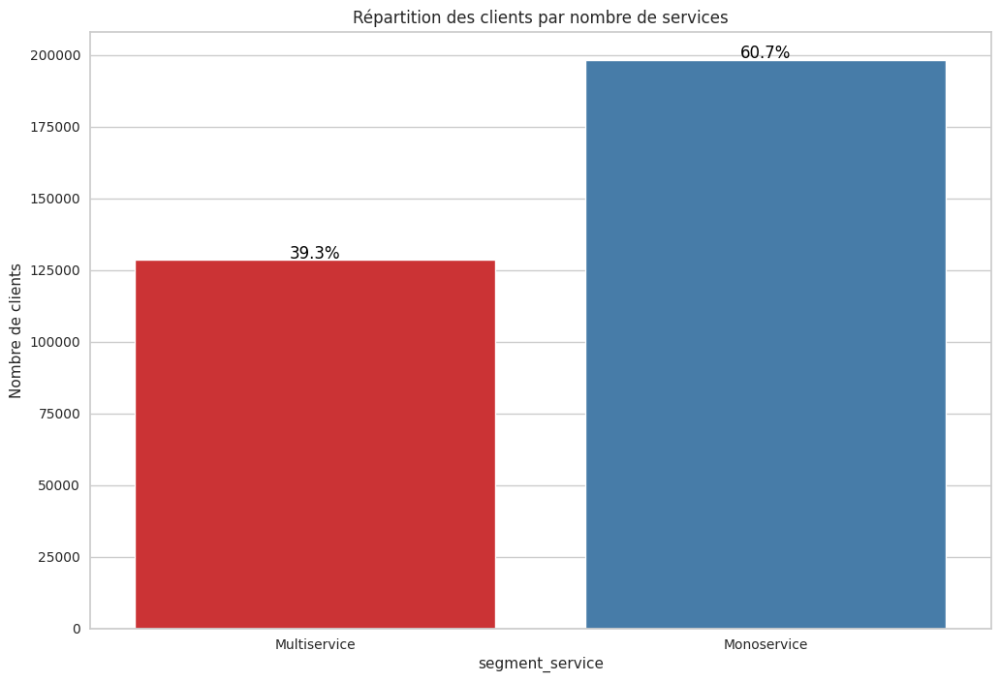

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créez un countplot avec une palette de couleurs personnalisée
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
sns.set(style="whitegrid")

custom_palette = sns.color_palette("Set1")

sns.countplot(x="segment_service", data=pd_segment_multiservice, palette=custom_palette)

# Calculez le nombre total de clients
total_count = len(pd_segment_multiservice)

# Annoter les barres avec des pourcentages
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total_count)
    ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Modifier l'étiquette de l'axe des ordonnées et le titre
ax.set_ylabel('Nombre de clients')
ax.set_title('Répartition des clients par nombre de services')

plt.show()


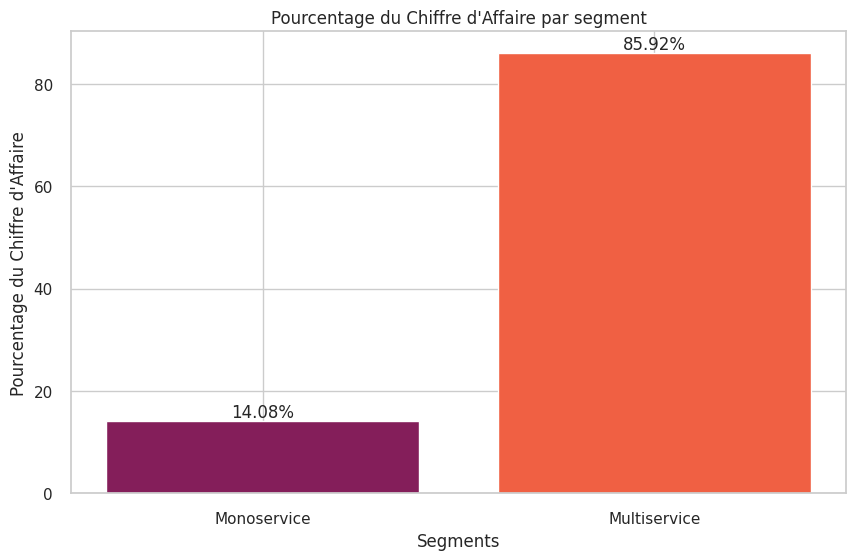

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convertir le dataframe Spark en un DataFrame Pandas
# Assurez-vous que vous avez déjà initialisé Spark et chargé les données dans pd_segment_multiservice

# Regroupez par le nombre de services et calculez le chiffre d'affaires total
service_grouped = pd_segment_multiservice.groupby('segment_service')['montant_total'].sum().reset_index()

# Calculez le pourcentage du chiffre d'affaires pour chaque nombre de services
total_montant = service_grouped['montant_total'].sum()
service_grouped['Pourcentage_montant'] = (service_grouped['montant_total'] / total_montant) * 100

# Créez une palette de couleurs diversifiée
diverse_palette = sns.color_palette("rocket", n_colors=len(service_grouped))

# Créez un graphique à barres en utilisant la palette de couleurs diversifiée
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(service_grouped.index, service_grouped['Pourcentage_montant'], color=diverse_palette)
ax.set_xlabel('Segments')
ax.set_ylabel('Pourcentage du Chiffre d\'Affaire')
ax.set_title('Pourcentage du Chiffre d\'Affaire par segment')

# Personnalisez les étiquettes de l'axe des abscisses
ax.set_xticks(service_grouped.index)
ax.set_xticklabels(service_grouped['segment_service'])

# Annoter les barres avec les pourcentages
for i, percentage in enumerate(service_grouped['Pourcentage_montant']):
    ax.annotate(f'{percentage:.2f}%', (service_grouped.index[i], percentage), ha='center', va='bottom')

plt.show()


# **MODÉLISATION POUR LA SEGMENTATION VALEUR RFM**

---



### Feature engineering

In [ ]:
# latest_date = to_date(lit("2023/08/17"), 'yyyy/MM/dd')
def df_rfm_prepare(df, date_debut, date_fin):
    date_col="date"
    date_debut_obj = datetime.strptime(date_debut, "%Y-%m-%d").date()
    date_fin_obj = datetime.strptime(date_fin, "%Y-%m-%d").date()

    # Filtrer le DataFrame
    df_rfm= df.filter((col(date_col) >= date_debut_obj) & (col(date_col) <= date_fin_obj))

    # Sélection des colonnes pertinentes pour RFM : numero, montant, date
    df_rfm = df_rfm.select("numero", "montant", "date")

    # Calcul de la date maximale dans le DataFrame
    max_date = df_rfm.agg(max("date").alias("max_date")).collect()[0]["max_date"]

    # Calcul de la récence (Recency)
    df_recency = df_rfm.groupBy("numero").agg(
        datediff(lit(date_fin), max(df["date"])).alias("recence")
    )

    # Calcul de la fréquence (Frequency, le nombre de transactions)
    df_frequency = df_rfm.groupBy("numero").agg(
        count("*").alias("frequence")
    )

    # Calcul de la valeur monétaire (Monetary Value, montant total des transactions)
    df_monetary = df_rfm.groupBy("numero").agg(
        sum("montant").alias("montant")
    )

    # Jointure des DataFrames Recency, Frequency et Monetary
    df_rfm = df_recency.join(df_frequency, "numero", "inner").join(df_monetary, "numero", "inner")

    return df_rfm

### Calcul des scores

In [ ]:
def calculer_scores_rfm(df_rfm):
    # Calculer les quantiles pour les caractéristiques recence, frequence et montant
    quantiles = df_rfm.approxQuantile(["recence", "frequence", "montant"], [0.2, 0.4, 0.6, 0.8], 0.01)

    # Définir des expressions conditionnelles pour attribuer les scores R, F, et M
    df_rfm = (df_rfm
        .withColumn("score_R",  when(df_rfm["recence"] <= quantiles[0][0], lit(5))
                                .when(df_rfm["recence"] <= quantiles[0][1], lit(4))
                                .when(df_rfm["recence"] <= quantiles[0][2], lit(3))
                                .when(df_rfm["recence"] <= quantiles[0][3], lit(2))
                                .otherwise(lit(1)))
        .withColumn("score_F", when(df_rfm["frequence"] >= quantiles[1][3], lit(5))
                                .when(df_rfm["frequence"] >= quantiles[1][2], lit(4))
                                .when(df_rfm["frequence"] >= quantiles[1][1], lit(3))
                                .when(df_rfm["frequence"] >= quantiles[1][0], lit(2))
                                .otherwise(lit(1)))
        .withColumn("score_M", when(df_rfm["montant"] >= quantiles[2][3], lit(5))
                                .when(df_rfm["montant"] >= quantiles[2][2], lit(4))
                                .when(df_rfm["montant"] >= quantiles[2][1], lit(3))
                                .when(df_rfm["montant"] >= quantiles[2][0], lit(2))
                                .otherwise(lit(1)))
                )
    df_rfm=df_rfm.withColumn("score_RFM", concat(df_rfm["score_R"].cast(StringType()), df_rfm["score_F"].cast(StringType()), df_rfm["score_M"].cast(StringType())))
    return df_rfm


### Profilage des segments

In [ ]:
def profiler_segments_rfm(df_rfm):
    segments = {
        'Champion': ['555', '554', '544', '545', '454', '455', '445'],
        'Fidèle': ['543', '444', '435', '355', '354', '345', '344', '335'],
        'Fidèle potentiel': [
            '553', '551', '552', '541', '542', '533', '532', '531', '452', '451', '442',
            '441', '431', '453', '433', '432', '423', '353', '352', '351', '342', '341', '333', '323'
        ],
        'Prometteur': [
            '525', '524', '523', '522', '521', '515', '514', '513', '425', '424', '413', '414',
            '415', '315', '314', '313'
        ],
        'À surveiller': ['535', '534', '443', '434', '343', '334', '325', '324'],
        'À risque': [
            '255', '254', '245', '244', '253', '252', '243', '242', '235', '234', '225', '224',
            '153', '152', '145', '143', '142', '135', '134', '133', '125', '124'
        ],
        'En sommeil': [
            '332', '322', '233', '232', '223', '222', '132', '123', '122', '212', '211'
        ],
        'Sur le point de dormir': [
            '331', '321', '312', '221', '213', '231', '241', '251'
        ],
        # 'Engagés en sommeil': ["111", "112", "121", "131", "141", "151"],
        'Perdu': ['111', '112', '121', '131', '141', '151'],
        'Nouveau': ['512', '511', '422', '421', '412', '411', '311']
    }

    # Utiliser une expression conditionnelle pour attribuer les segments en fonction des scores RFM
    df_rfm = (df_rfm
        .withColumn('segment_RFM',
            when(df_rfm['score_RFM'].isin(segments['Champion']), lit('Champion'))
            .when(df_rfm['score_RFM'].isin(segments['Fidèle']), lit('Fidèle'))
            .when(df_rfm['score_RFM'].isin(segments['Fidèle potentiel']), lit('Fidèle potentiel'))
            .when(df_rfm['score_RFM'].isin(segments['Nouveau']), lit('Nouveau'))
            .when(df_rfm['score_RFM'].isin(segments['Prometteur']), lit('Prometteur'))
            .when(df_rfm['score_RFM'].isin(segments['À surveiller']), lit('À surveiller'))
            .when(df_rfm['score_RFM'].isin(segments['À risque']), lit('À risque'))
            .when(df_rfm['score_RFM'].isin(segments['Sur le point de dormir']), lit('Sur le point de dormir'))
            .when(df_rfm['score_RFM'].isin(segments['En sommeil']), lit('En sommeil'))
            # .when(df_rfm['score_RFM'].isin(segments['Engagés en sommeil']), lit('Engagés en sommeil'))
            .when(df_rfm['score_RFM'].isin(segments['Perdu']), lit('Perdu'))
            .otherwise(lit('Autre'))
        )
    )

    return df_rfm


### Test de la méthode RFM

In [ ]:
def segmenter_valeur_rfm(dataFrame: DataFrame, date_debut,date_fin):

  df_rfm=df_rfm_prepare(dataFrame,date_debut, date_fin)
  df_rfm_scores= calculer_scores_rfm(df_rfm)
  df_rfm_segments = profiler_segments_rfm(df_rfm_scores)
  return df_rfm_segments


In [ ]:
df_rfm_segments=segmenter_valeur_rfm(df_transaction_prepared, "2023-01-12","2023-08-16")
df_rfm_segments.show()

+-------+-------+---------+--------+-------+-------+-------+---------+--------------------+
| numero|recence|frequence| montant|score_R|score_F|score_M|score_RFM|         segment_RFM|
+-------+-------+---------+--------+-------+-------+-------+---------+--------------------+
|1000000|    110|        6| 90500.0|      2|      5|      5|      255|            À risque|
|1000001|     91|        2|  4950.0|      2|      3|      2|      232|          En sommeil|
|1000038|      4|        5| 12000.0|      5|      5|      3|      553|    Fidèle potentiel|
|1000048|      2|        5|257000.0|      5|      5|      5|      555|            Champion|
|1000054|     42|        2|  4000.0|      3|      3|      2|      332|          En sommeil|
| 100008|    178|        2| 25000.0|      1|      3|      4|      134|            À risque|
| 100010|    105|        1| 53000.0|      2|      2|      4|      224|            À risque|
|1000101|     28|        4| 52300.0|      3|      4|      4|      344|          

In [ ]:
def segment_client_rfm(numero,date_debut,date_fin):
  df_rfm_taken=segmenter_valeur_rfm(df_transaction_prepared,date_debut, date_fin)
  rfm_result=df_rfm_taken.drop("score_R","score_F","score_M").where(df_rfm_taken["numero"]==numero).collect()
  rfm_result= [row.asDict() for row in rfm_result]
  if rfm_result:
    rfm_result[0]["période"] = [date_debut, date_fin]
    return rfm_result
  else:
    info_client=[f'Aucune transaction du client {numero} sur cette période']
    return info_client

In [ ]:
segment_client_rfm(1000263,"2023-01-02","2023-08-14")

[{'numero': '1000263',
  'recence': 21,
  'frequence': 16,
  'montant': 118869.0,
  'score_RFM': '355',
  'segment_RFM': 'Fidèle',
  'période': ['2023-01-02', '2023-08-14']}]

### Sauvegarde du DataFrame RFM

In [ ]:
#Save to csv
pd_rfm_segments=df_rfm_segments.toPandas()
pd_rfm_segments_sort =pd_rfm_segments.sort_values(["score_RFM"])

In [ ]:
pd_rfm_segments.to_csv('#datasets_OM/segments_rfm.csv', index=False)

In [ ]:
# pd_rfm_segments=pd.read_csv('#datasets_OM/base_transaction_om_rfm.csv')
# pd_rfm_segments_sort =pd_rfm_segments.sort_values(["score_RFM"])

### Exploration du Dataframe RFM

In [ ]:
df_info(df_rfm_segments)

root
 |-- numero: string (nullable = true)
 |-- recence: integer (nullable = true)
 |-- frequence: long (nullable = false)
 |-- montant: double (nullable = true)
 |-- score_R: integer (nullable = false)
 |-- score_F: integer (nullable = false)
 |-- score_M: integer (nullable = false)
 |-- score_RFM: string (nullable = false)
 |-- segment_RFM: string (nullable = false)

['numero', 'recence', 'frequence', 'montant', 'score_R', 'score_F', 'score_M', 'score_RFM', 'segment_RFM']

 
  Nombre de lignes : 326744, Nombre de colonnes : 9
+-------+-------+---------+--------+-------+-------+-------+---------+----------------+
|numero |recence|frequence|montant |score_R|score_F|score_M|score_RFM|segment_RFM     |
+-------+-------+---------+--------+-------+-------+-------+---------+----------------+
|1000000|111    |18       |277100.0|3      |5      |5      |355      |Fidèle          |
|1000001|92     |9        |58650.0 |3      |5      |4      |354      |Fidèle          |
|1000038|5      |5        

In [ ]:
taken_columns_sico = [ 'nd', 'date_naissance', 'date_debut_engagement', 'statut']
df_sic = df_sico.select(taken_columns_sico) \
          .filter(df_sico["statut"]=="ACTIF")  \
          .filter(df_sico["date_naissance"] != "NULL")\
          .withColumnRenamed("nd", "numero") \
          .drop("statut")

df_sic= df_sic.withColumn("anciennete",  year(current_date()) - year("date_debut_engagement"))\
        .withColumn("age", year(current_date()) - year("date_naissance")).drop("date_naissance")\
        .filter(col("age")>15) \
        .filter(col("age")<90) \
        .drop("date_debut_engagement")


# ville_set=collect_set(df_localisation["ca_cr_commune"]).alias("villes")
# df_loc=df_localisation.select("msisdn","ca_cr_commune") \
#                       .groupBy("msisdn").agg(ville_set, size(ville_set).alias("nombre_villes"))\
#                       .withColumnRenamed("msisdn","numero")

df_rfm_joined=df_rfm_segments.drop('score_R','score_F','score_M').join(df_sic,'numero', 'inner')
pd_rfm_joined= df_rfm_joined.toPandas()

In [ ]:
df_rfm_joined.printSchema()

In [ ]:
pd_rfm_joined.describe()

In [ ]:
import pandas as pd

# Define the custom formatting function
def format_with_space(value):
    if isinstance(value, (int, float)):
            return f"{value:,.0f}".replace(",", " ")
    return value

# Select the specific columns and calculate the default summary
selected_columns = ["numero", "recence", "frequence", "montant"]
summary = pd_rfm_segments[selected_columns].describe()

# Apply custom formatting to the summary
formatted_summary = summary.applymap(lambda x: format_with_space(x) if isinstance(x, (int, float)) else x)

# Print the formatted summary
formatted_summary


In [ ]:
import pandas as pd

# Supposons que vous avez déjà un DataFrame pd_rfm_segments
# Vous pouvez l'initialiser comme suit
# pd_rfm_segments = pd.read_csv('votre_fichier.csv')

# Groupement par segment_RFM et calcul des statistiques pour chaque groupe
segment_stats = pd_rfm_segments.groupby('segment_RFM').agg({
    'numero': 'count',  # Nombre de clients
    'recence': ['min', 'max', 'mean'],  # Min, max et moyenne de recence
    'frequence': ['min', 'max', 'mean'],  # Min, max et moyenne de Fréquence
    'montant': ['min', 'max', 'mean']  # Min, max et moyenne de montant
})

# Renommer les colonnes pour plus de clarté
segment_stats.columns = ['Nombre_clients', 'R_min', 'R_max', 'R_moy',
                         'F_min', 'F_max', 'F_moy',
                         'M_min', 'M_max', 'M_moy']

# Calculer le pourcentage des clients et le convertir en pourcentage (avec deux chiffres après la virgule)
total_clients = segment_stats['Nombre_clients'].sum()
segment_stats['%Clients'] = (segment_stats['Nombre_clients'] / total_clients * 100).apply(lambda x: f'{x:.2f} %')
segment_stats = segment_stats.drop('Nombre_clients', axis=1)  # Supprimer la colonne Nombre_clients

# Définir une fonction pour formater avec un espace comme séparateur des milliers
def format_with_space(value):
    return f"{value:,.0f}".replace(",", " ")

# Appliquer la fonction de formatage aux colonnes appropriées
formatted_segment_stats = segment_stats.copy()
formatted_segment_stats = formatted_segment_stats.applymap(lambda x: format_with_space(x) if isinstance(x, (int, float)) else x)

# Utiliser Styler.format pour afficher le DataFrame avec le format des milliers
formatted_segment_stats.style.format(formatter=None)


In [ ]:
import pandas as pd

data = {
    'Segment': ['Champions', 'Fidèles', 'Fidèles potentiels', 'A Surveiller', 'Nouveaux', 'Prometteurs',
                'Sur le point de dormir', 'À Risque', 'En sommeil', 'Perdus'],
    'Activité': [
        "Ont récemment acheté, commandent souvent et dépensent le plus.",
        "Passent régulièrement des commandes. Réactifs aux promotions.",
        "Clients récents qui ont dépensé des sommes importantes.",
        "Clients de base dont le dernier achat remonte à plus d'un mois.",
        "Ont acheté très récemment.",
        "Loyalistes potentiels il y a quelques mois. Dépensent fréquemment et une somme importante. Mais le dernier achat remonte à plusieurs semaines.",
        "Ont fait leur dernier achat il y a longtemps, mais au cours des 4 dernières semaines, ils ont soit visité le site soit ouvert un e-mail.",
        "Ont effectué les plus grosses commandes et souvent. Mais ils ne sont pas revenus depuis longtemps.",
        "Clients qui ont fait des achats plus petits et moins fréquents auparavant, mais qui n'ont rien acheté depuis longtemps.",
        "Ont effectué leur dernier achat il y a longtemps et n'ont pas du tout été actifs au cours des 4 dernières semaines."
    ]
}

df = pd.DataFrame(data)

# Centrer le texte dans la colonne 'Activité' et changer la couleur en bleu et blanc
def highlight_text(text):
    return f'text-align: center;'

styled_df = df.style.applymap(highlight_text)

# Add borders between columns
styled_df.set_properties(**{
    'border': '1px solid white',
    'border-collapse': 'collapse',
    'text-align': 'center'
})


In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

# Given data and segments
data = {
    'Champion': ['555', '554', '544', '545', '454', '455', '445'],
    'Fidèle': ['543', '444', '435', '355', '354', '345', '344', '335'],
    'Fidèle potentiel': [
        '553', '551', '552', '541', '542', '533', '532', '531', '452', '451', '442',
        '441', '431', '453', '433', '432', '423', '353', '352', '351', '342', '341', '333', '323'
    ],
    'Prometteur': [
        '525', '524', '523', '522', '521', '515', '514', '513', '425', '424', '413', '414',
        '415', '315', '314', '313'
    ],
    'À surveiller': ['535', '534', '443', '434', '343', '334', '325', '324'],
    'À risque': [
        '255', '254', '245', '244', '253', '252', '243', '242', '235', '234', '225', '224',
        '153', '152', '145', '143', '142', '135', '134', '133', '125', '124'
    ],
    'En sommeil': [
        '332', '322', '233', '232', '223', '222', '132', '123', '122', '212', '211'
    ],
    'Sur le point de dormir': [
        '331', '321', '312', '221', '213', '231', '241', '251'
    ],
    'Perdu': ['111', '112', '121', '131', '141', '151'],
    'Nouveau': ['512', '511', '422', '421', '412', '411', '311']
}

# Create a DataFrame with two columns: "segment_RFM" and "score_RFM"
df_segments_scores = None

for segment, scores in data.items():
    segment_df_segments_scores = spark.createDataFrame([(segment, score) for score in scores], ["segment_RFM", "score_RFM"])
    if df_segments_scores is None:
        df_segments_scores = segment_df_segments_scores
    else:
        df_segments_scores = df_segments_scores.union(segment_df_segments_scores)

# Assuming you have a DataFrame called df_segments_scores_rfm_segments
# First, group by the "segment_RFM" column and collect the "RFM_score" values into a list
result_df_segments_scores = df_segments_scores.groupBy("segment_RFM").agg(collect_set("RFM_score").alias("score_RFMs"))

# Show the result DataFrame
result_df_segments_scores.toPandas()


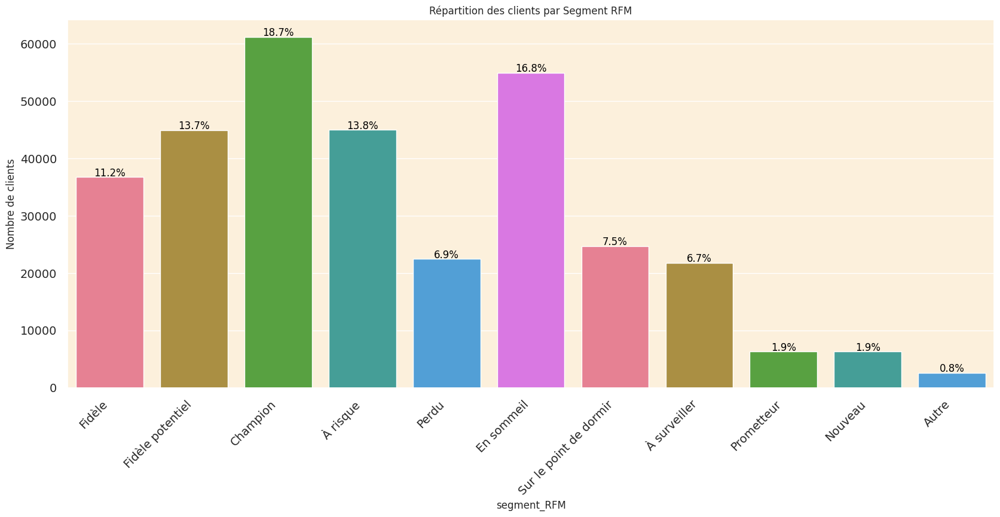

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créez un countplot avec une palette de couleurs personnalisée
fig, ax = plt.subplots(1, 1, figsize=(20, 8))
sns.set(style="whitegrid")

custom_palette = sns.color_palette("husl")

sns.countplot(x="segment_RFM", data=pd_rfm_segments, palette=custom_palette)

# Calculez le nombre total de clients
total_count = len(pd_rfm_segments)

# Annoter les barres avec des pourcentages
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total_count)
    ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Modifier l'étiquette de l'axe des ordonnées et le titre
ax.set_ylabel('Nombre de clients')
ax.set_title('Répartition des clients par Segment RFM')

# Rotation des étiquettes de l'axe des abscisses de 45 degrés
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Augmenter la taille de la police
ax.tick_params(axis='both', labelsize=14)

plt.show()


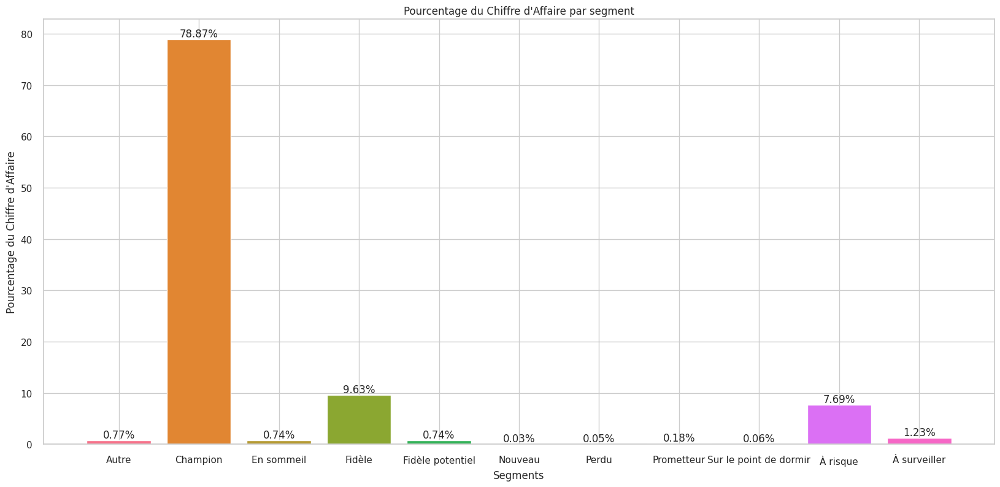

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Regroupez par le nombre de services et calculez le chiffre d'affaires total
service_grouped = pd_rfm_segments.groupby('segment_RFM')['montant'].sum().reset_index()

# Calculez le pourcentage du chiffre d'affaires pour chaque nombre de services
total_montant = service_grouped['montant'].sum()
service_grouped['Pourcentage_montant'] = (service_grouped['montant'] / total_montant) * 100

# Créez une palette de couleurs diversifiée
diverse_palette = sns.color_palette("husl", n_colors=len(service_grouped))

# Créez un graphique à barres en utilisant la palette de couleurs diversifiée
fig, ax = plt.subplots(figsize=(20, 9))
ax.bar(service_grouped.index, service_grouped['Pourcentage_montant'], color=diverse_palette)
ax.set_xlabel('Segments')
ax.set_ylabel('Pourcentage du Chiffre d\'Affaire')
ax.set_title('Pourcentage du Chiffre d\'Affaire par segment')

# Personnalisez les étiquettes de l'axe des abscisses
ax.set_xticks(service_grouped.index)
ax.set_xticklabels(service_grouped['segment_RFM'])

# Annoter les barres avec les pourcentages
for i, percentage in enumerate(service_grouped['Pourcentage_montant']):
    ax.annotate(f'{percentage:.2f}%', (service_grouped.index[i], percentage), ha='center', va='bottom')

plt.show()


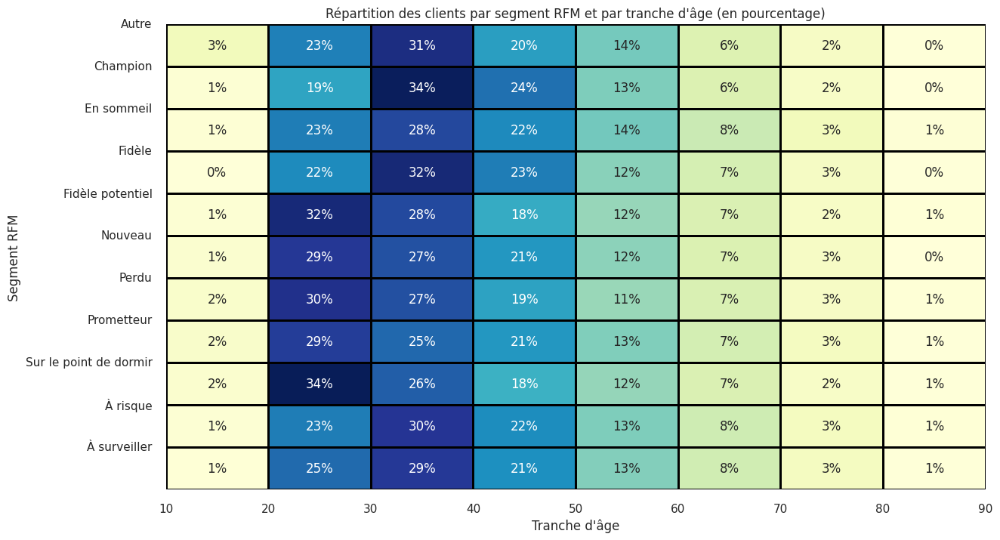

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que vous avez déjà un DataFrame pd_rfm_joined
# Vous pouvez le charger à partir d'une source de données ou d'un fichier CSV

# Créez une nouvelle colonne 'AgeGroup' pour regrouper les clients par tranches d'âge de 10 ans
pd_rfm_joined['AgeGroup'] = (pd_rfm_joined['age'] // 10) * 10

# Grouper les données par segment RFM et tranche d'âge, puis calculer les pourcentages en multipliant par 100
grouped_data = pd_rfm_joined.groupby(['segment_RFM', 'AgeGroup']).size().unstack().div(pd_rfm_joined.groupby('segment_RFM').size(), axis=0) * 100

# Récupérer les étiquettes des tranches d'âge
age_labels = [f'{i}' for i in range(10, 100, 10)]

# Ajouter le signe '%' aux annotations
annot_data = grouped_data.applymap(lambda x: f'{x:.0f}%')

# Afficher le tableau de répartition avec les pourcentages en pourcentage (%)
plt.figure(figsize=(14, 8))
sns.heatmap(grouped_data, annot=annot_data, cmap='YlGnBu', cbar=False, fmt='', linewidths=1, linecolor='black')
plt.title("Répartition des clients par segment RFM et par tranche d'âge (en pourcentage)")
plt.xlabel("Tranche d'âge")
plt.ylabel("Segment RFM")

# Déplacer les étiquettes des tranches d'âge au centre
plt.xticks(range(len(age_labels)), age_labels, rotation=0)

# Déplacer les étiquettes des tranches d'âge de 50 mm vers le bas
plt.yticks(range(len(grouped_data.index)), grouped_data.index, va="center")

plt.show()


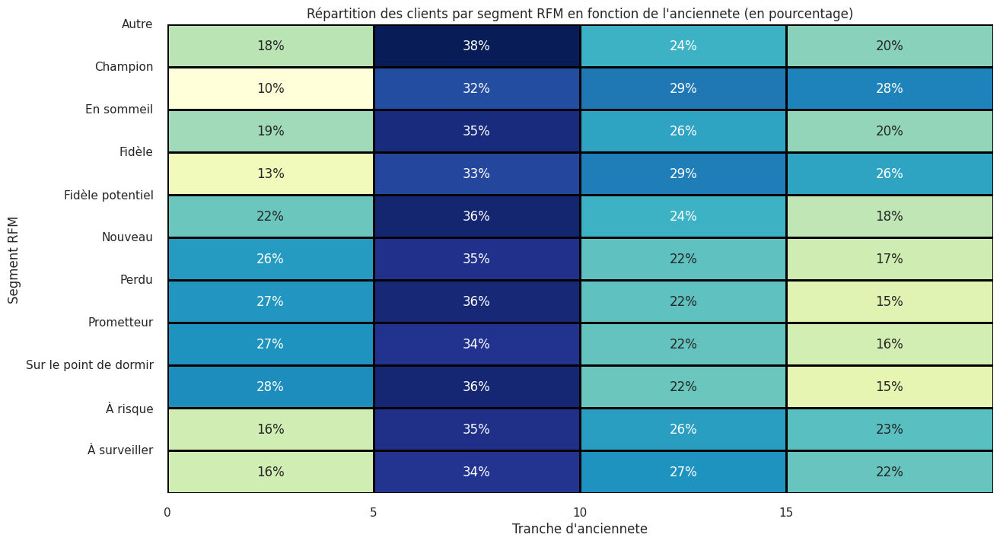

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que vous avez déjà un DataFrame pd_rfm_joined
# Vous pouvez le charger à partir d'une source de données ou d'un fichier CSV

# Créez une nouvelle colonne 'AgeGroup' pour regrouper les clients par tranches d'âge de 10 ans
pd_rfm_joined['AgeGroup'] = (pd_rfm_joined['anciennete'] // 5) * 10

# Grouper les données par segment RFM et tranche d'âge, puis calculer les pourcentages en multipliant par 100
grouped_data = pd_rfm_joined.groupby(['segment_RFM', 'AgeGroup']).size().unstack().div(pd_rfm_joined.groupby('segment_RFM').size(), axis=0) * 100

# Récupérer les étiquettes des tranches d'âge
age_labels = [f'{i}' for i in range(0, 20, 5)]

# Ajouter le signe '%' aux annotations
annot_data = grouped_data.applymap(lambda x: f'{x:.0f}%')

# Afficher le tableau de répartition avec les pourcentages en pourcentage (%)
plt.figure(figsize=(14, 8))
sns.heatmap(grouped_data, annot=annot_data, cmap='YlGnBu', cbar=False, fmt='', linewidths=1, linecolor='black')
plt.title("Répartition des clients par segment RFM en fonction de l'anciennete (en pourcentage)")
plt.xlabel("Tranche d'anciennete")
plt.ylabel("Segment RFM")

# Déplacer les étiquettes des tranches d'âge au centre
plt.xticks(range(len(age_labels)), age_labels, rotation=0)

# Déplacer les étiquettes des tranches d'âge de 50 mm vers le bas
plt.yticks(range(len(grouped_data.index)), grouped_data.index, va="center")

plt.show()

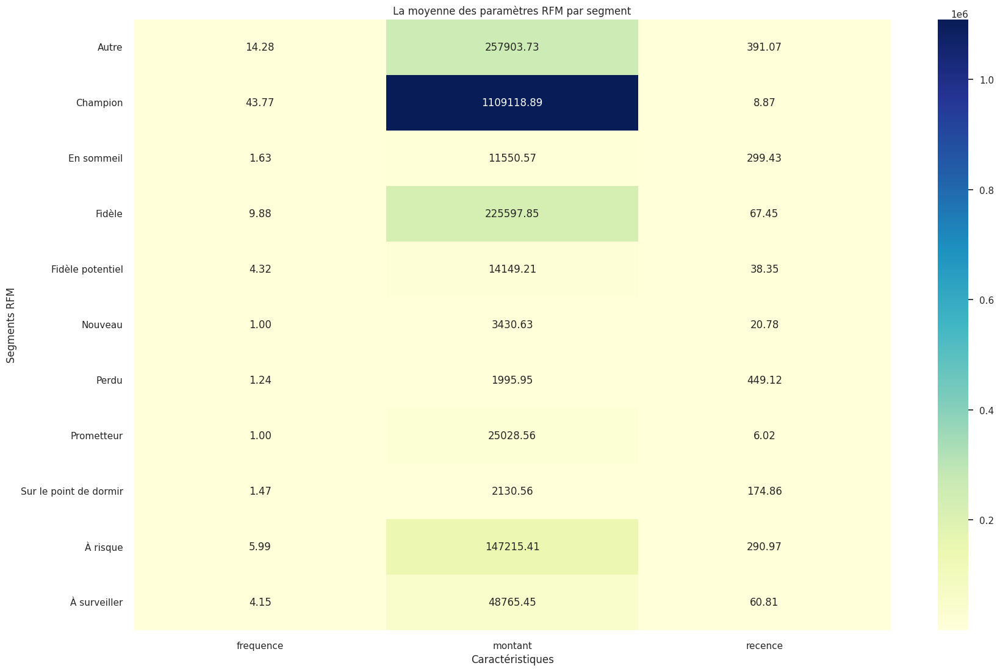

In [ ]:
import pandas as pd

# Supposons que vous avez un DataFrame "df" contenant les données

# Sélectionnez les colonnes pertinentes
selected_columns = ['recence', 'frequence', 'montant', 'segment_RFM']

# Créez un nouveau DataFrame contenant uniquement ces colonnes
df_selected = pd_rfm_segments[selected_columns]

# Utilisez la fonction pivot_table pour créer la matrice de correspondance
matrix = pd.pivot_table(df_selected, index='segment_RFM')
# Créez un heatmap pour représenter la matrice de passage
plt.figure(figsize=(20, 13))
sns.heatmap(matrix, annot=True, fmt=".2f", cmap="YlGnBu")

# Personnalisez le graphique
plt.title('La moyenne des paramètres RFM par segment')
plt.xlabel('Caractéristiques')
plt.ylabel('Segments RFM')

# Affichez le graphique
plt.show()



In [ ]:
# Visualization of correlation results with seaborn library pairplot
sns.pairplot(pd_rfm_segments, hue = "segment_RFM")

# **MODÉLISATION POUR LA SEGMENTATION VALEUR K-MEANS**

---



### **Feature engineering**

#### Sélection de variables

In [ ]:
def df_km_create_sico(df_sico):
    taken_columns_sico = ['nd', 'date_naissance', 'date_debut_engagement', 'statut']
    df_km_sic = df_sico.select(taken_columns_sico) \
                    .filter(df_sico["statut"] == "ACTIF") \
                    .filter(df_sico["date_naissance"] != "NULL") \
                    .withColumnRenamed("nd", "numero") \
                    .drop("statut")
    df_km_sic = df_km_sic.withColumn("anciennete", year(current_date()) - year("date_debut_engagement")) \
                  .withColumn("age", year(current_date()) - year("date_naissance")).drop("date_naissance") \
                  .filter(col("age") > 10) \
                  .filter(col("age") < 100) \
                  .drop("date_debut_engagement")
    return df_km_sic

def df_km_create_ville(df_location):

    # Renommez la colonne commune_arrondissement en "ville"
    df_clients_top_villes = df_location.select("msisdn", "commune_arrondissement") \
                                          .withColumnRenamed("commune_arrondissement", "ville").withColumnRenamed("msisdn","numero")

    # # Sélectionnez les top 15 communes_arrondissements
    # df_top_villes = df_location.groupBy("commune_arrondissement").count().orderBy(col("count").desc()).limit(18)

    # # Sélectionnez les clients dans les communes_arrondissements spécifiées
    # df_clients_top_villes = df_location.select("msisdn", "commune_arrondissement") \
    #     .filter(col("commune_arrondissement").isin([row.commune_arrondissement for row in df_top_villes.collect()]))


    # Remplacez les valeurs spécifiques
    replacements = {
        "NDAME": "TOUBA",
        "NIAYES": "KEUR MASSAR",
        "PIKINE DAGOUDANE": "PIKINE",
        "BAMBILOR": "SANGALKAM"
    }

    for old_value, new_value in replacements.items():
        df_clients_top_villes = df_clients_top_villes.na.replace(old_value, new_value, "ville")

    return df_clients_top_villes


def df_km_create_transaction_aggregated(df_transaction):
    latest_date = to_date(lit("2023/08/17"), 'yyyy/MM/dd')
    df_km_transaction_aggregated1 = df_transaction.groupBy("numero") \
        .agg(datediff(latest_date, max(df_transaction["date"])).alias("recence"),
             count("*").alias("frequence_total"),
             sum(df_transaction["montant"].cast("double")).alias("montant_total"))
     #Nombre de destinataires
    df_km_transaction_aggregated2 = df_transaction.filter(col("type_service")=="Transfert").groupBy("numero").agg(countDistinct("destinataire").alias("nombre_destinataires"))
    df_km_transaction_aggregated=df_km_transaction_aggregated1.join(df_km_transaction_aggregated2,"numero","inner")
    return df_km_transaction_aggregated

def df_km_create_transaction_categorie_service(df_transaction):
    # Créez un DataFrame vide pour stocker les résultats agrégés
    df_km_transaction_categorie = df_transaction

    # Liste des catégories de service uniques
    categories_services = ['service_financier', 'service_paiement', 'service_achat', 'don_cotisation']

    # Utilisez une boucle pour créer des colonnes de montant et de fréquence pour chaque catégorie de service
    for categorie in categories_services:
        # Créez une colonne temporaire pour le montant de la catégorie de service
        col_montant = f"montant_{categorie}"
        df_km_transaction_categorie = df_km_transaction_categorie.withColumn(col_montant, when(df_km_transaction_categorie["categorie_service"] == categorie, df_km_transaction_categorie["montant"]).otherwise(0))

        # Créez une colonne temporaire pour la fréquence de la catégorie de service
        col_frequence = f"frequence_{categorie}"
        df_km_transaction_categorie = df_km_transaction_categorie.withColumn(col_frequence, when(df_km_transaction_categorie["categorie_service"] == categorie, 1).otherwise(0))

    # Effectuez l'agrégation en regroupant par d'autres colonnes si nécessaire
    df_km_transaction_categorie = df_km_transaction_categorie.groupBy("numero").sum()

    # Renommez les colonnes agrégées
    for categorie in categories_services:
        col_montant = f"montant_{categorie}"
        col_frequence = f"frequence_{categorie}"
        df_km_transaction_categorie = df_km_transaction_categorie.withColumnRenamed(f"sum({col_montant})", col_montant)\
                                                .withColumnRenamed(f"sum({col_frequence})", col_frequence)\
                                                .drop("sum(montant)")

    return df_km_transaction_categorie

def df_km_create_segment_palier(df_segment_palier):
    #Integration des donnés de la segmentation palier
    taken_columns_palier=['msisdn','palier_inf','palier_sup']
    df_km_palier = df_segment_palier.select(taken_columns_palier) \
                  .withColumn("palier_inf", col("palier_inf").cast("double"))\
                  .withColumn("palier_sup", col("palier_sup").cast("double")) \
                  .withColumnRenamed("msisdn", "numero")
    return df_km_palier

def df_km_create_segment_multiservice(df_segment_multiservice):
    #Integration des donnés de la segmentation multiservice
    taken_columns_multiservice=["numero","nombre_services","nombre_canaux"]
    df_km_segment_multiservice=df_segment_multiservice.select(taken_columns_multiservice)
    return df_km_segment_multiservice


def df_km_create_segment_recharge(df_segment_recharge):
    #Intégration des données de la segmentation recharge
    max_year_df_km_recharge = df_segment_recharge.agg({"year": "max"}).collect()[0][0]
    max_month_df_km_recharge = df_segment_recharge.filter(col("year") == max_year_df_km_recharge)\
            .agg({"month": "max"}).collect()[0][0]
    df_km_latest_segment_recharge = df_segment_recharge.withColumnRenamed("msisdn","numero")\
                                  .withColumnRenamed("avg_montant_recharge","latest_avg_montant_recharge") \
                                  .filter((col("year") == max_year_df_km_recharge) & (col("month") == max_month_df_km_recharge)) \
                                  .select("numero","latest_avg_montant_recharge") \
                                  .withColumn("latest_avg_montant_recharge", col("latest_avg_montant_recharge").cast("double"))
    return df_km_latest_segment_recharge


def df_kmeans_create(df_sico, df_transaction, *dataframes_to_join):
    df_sic = df_km_create_sico(df_sico)
    df_km_created = df_sic

    for df_km_to_join in dataframes_to_join:
        df_km_created = df_km_created.join(df_km_to_join, "numero", "inner")
    return df_km_created

In [ ]:
# Appel de la fonction df_kmeans_create avec les DataFrames en tant qu'arguments
df_kmeans_created_init = df_kmeans_create(
    df_sico,
    df_transaction_prepared,
    df_km_create_ville(df_localisation),
    df_km_create_transaction_aggregated(df_transaction_prepared),
    df_km_create_segment_palier(df_segment_palier),
    df_km_create_segment_recharge(df_segment_recharge),
    df_km_create_segment_multiservice(df_segment_multiservice),
    df_km_create_transaction_categorie_service(df_transaction_prepared)
)

#### Encodage des variables

In [ ]:
def df_kmeans_encode(df_to_encode:DataFrame, categorical_columns: list):
    #Encodage des variables catégorielles
    # Initialiser les étapes pour le pipeline
    df_to_encode=df_to_encode
    etapes = []

    # Appliquer StringIndexer pour l'encodage des étiquettes
    for col in categorical_columns:
        indexer = StringIndexer(inputCol=col, outputCol=col + "_index")
        etapes.append(indexer)

    # Créer un pipeline
    pipeline = Pipeline(stages=etapes)

    # Ajuster et transformer le DataFrame à l'aide du pipeline
    model = pipeline.fit(df_to_encode)
    df_encoded = model.transform(df_to_encode) \
                      # .drop(*categorical_columns)
    return df_encoded

In [ ]:
df_kmeans_encoded=df_kmeans_encode(df_kmeans_created_init, categorical_columns=["ville"])
pd_kmeans_encoded=df_kmeans_encoded.toPandas()
print(f'Nombre de features: {len(df_kmeans_encoded.columns)}')
df_kmeans_encoded.printSchema()

Nombre de features: 22
root
 |-- numero: string (nullable = true)
 |-- anciennete: integer (nullable = true)
 |-- age: integer (nullable = true)
 |-- ville: string (nullable = true)
 |-- recence: integer (nullable = true)
 |-- frequence_total: long (nullable = false)
 |-- montant_total: double (nullable = true)
 |-- nombre_destinataires: long (nullable = false)
 |-- palier_inf: double (nullable = true)
 |-- palier_sup: double (nullable = true)
 |-- latest_avg_montant_recharge: double (nullable = true)
 |-- nombre_services: integer (nullable = false)
 |-- nombre_canaux: integer (nullable = false)
 |-- montant_service_financier: double (nullable = true)
 |-- frequence_service_financier: long (nullable = true)
 |-- montant_service_paiement: double (nullable = true)
 |-- frequence_service_paiement: long (nullable = true)
 |-- montant_service_achat: double (nullable = true)
 |-- frequence_service_achat: long (nullable = true)
 |-- montant_don_cotisation: double (nullable = true)
 |-- freque

In [ ]:
df_kmeans_encoded.select("ville","ville_index").distinct().orderBy("ville_index").count()

246

#### Normalisation des variables

In [ ]:
from sklearn.preprocessing import StandardScaler

def df_km_scale(pd_dataframe, features_to_exclude):

    # Initialize the StandardScaler
    scaler = StandardScaler()
    # List of columns that need to be scaled
    columns_to_scale = pd_dataframe.columns.difference(features_to_exclude)

    # Copy the dataset
    scaled_dataframe = pd_dataframe.copy()

    # Applying the scaler to the necessary columns in the dataset
    scaled_dataframe[columns_to_scale] = scaler.fit_transform(scaled_dataframe[columns_to_scale])

    return scaled_dataframe

features_to_exclude_scale=['numero','ville']
features_to_exclude_train=['numero','ville']
# Specify the correct column name in the categorical_columns parameter
pd_kmeans_scaled = df_km_scale(pd_kmeans_encoded,features_to_exclude_scale)
#Colonnes
km_feature_columns = pd_kmeans_scaled.columns.difference(features_to_exclude_train)

pd_kmeans_scaled.head()


,numero,anciennete,age,ville,recence,frequence_total,montant_total,nombre_destinataires,palier_inf,palier_sup,...,nombre_canaux,montant_service_financier,frequence_service_financier,montant_service_paiement,frequence_service_paiement,montant_service_achat,frequence_service_achat,montant_don_cotisation,frequence_don_cotisation,ville_index
0,1000001,0.961195,-0.545850,PIKINE,0.955227,-0.561736,-0.399282,-0.603881,-0.257657,-0.139977,...,0.613042,-0.351967,-0.464852,-0.146580,-0.413341,0.093012,-0.033769,-0.00931,-0.015699,-0.238119
1,1000001,0.961195,-0.545850,PARCELLES ASSAINIES,0.955227,-0.561736,-0.399282,-0.603881,-0.257657,-0.139977,...,0.613042,-0.351967,-0.464852,-0.146580,-0.413341,0.093012,-0.033769,-0.00931,-0.015699,-0.417634
2,1000339,-1.526578,-0.804380,MABO,-0.532855,-0.825383,-0.407622,-0.603881,-0.435336,-0.140350,...,-1.617152,-0.351302,-0.543563,-0.146580,-0.413341,-0.608350,-0.720195,-0.00931,-0.015699,5.183237
3,1000339,-1.526578,-0.804380,MBOUR,-0.532855,-0.825383,-0.407622,-0.603881,-0.435336,-0.140350,...,-1.617152,-0.351302,-0.543563,-0.146580,-0.413341,-0.608350,-0.720195,-0.00931,-0.015699,-0.094507
4,1000708,-0.780246,-0.373496,THIES,-0.169102,0.440123,0.193587,-0.322238,1.011477,-0.136760,...,0.613042,0.002473,0.322257,0.165288,-0.054340,-0.324363,-0.548589,-0.00931,-0.015699,-0.345828


### **Modele 1 (sklearn)**

#### Matrice de corrélation

<ipython-input-16-a857fa03bebf>:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = dataframe.drop(columns=['numero']).corr()


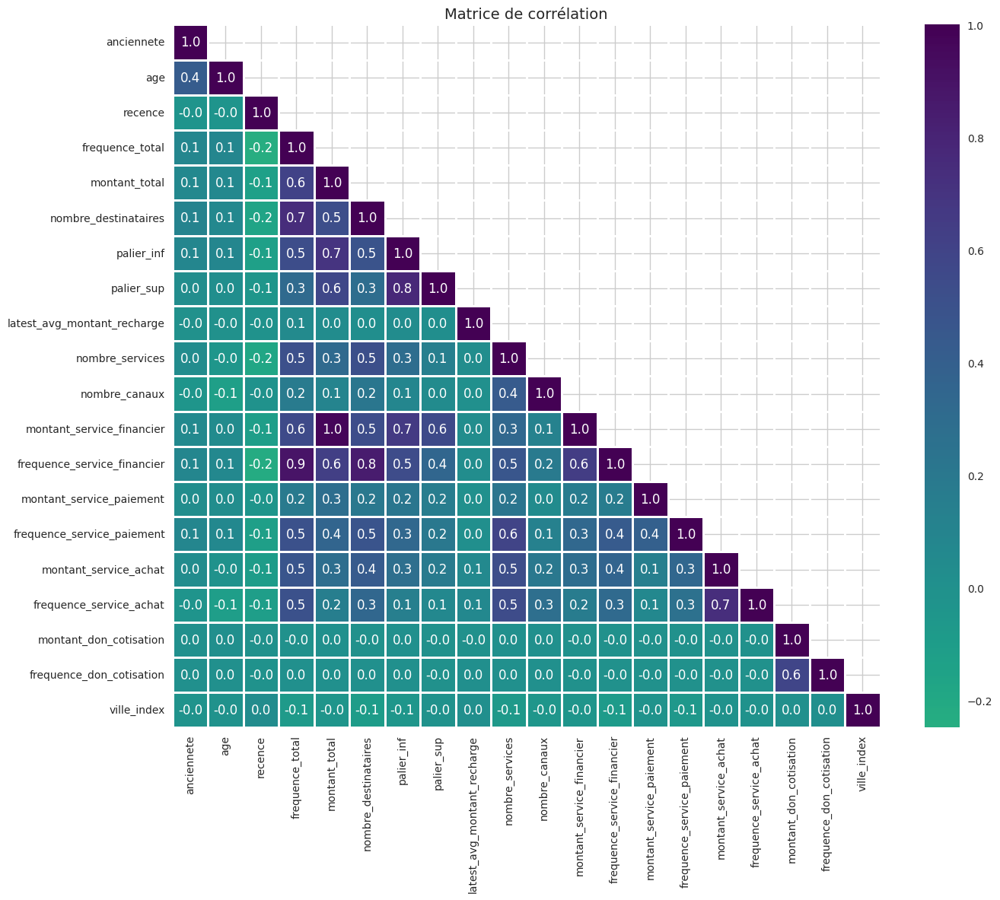

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_correlation_matrix(dataframe):
    # Reset background style
    sns.set_style('whitegrid')

    # Calculate the correlation matrix excluding certain columns
    corr = dataframe.drop(columns=['numero']).corr()

    # Create a mask to only show the lower triangle of the matrix
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask, k=1)] = True

    # Plot the heatmap
    plt.figure(figsize=(15, 12))
    sns.heatmap(corr, mask=mask, annot=True, center=0, cmap="viridis_r", fmt='.1f', linewidths=2)
    plt.title('Matrice de corrélation', fontsize=14)
    plt.show()

# Usage example:
plot_correlation_matrix(pd_kmeans_scaled)


#### Réduction de dimension avec ACP

##### Nombre de dimensions

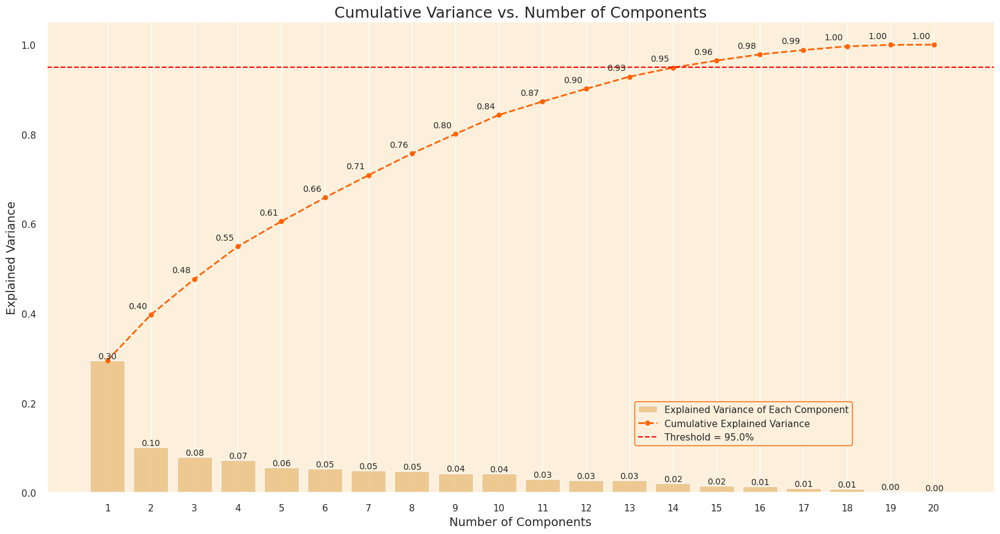

Number of components to reach 95.0% cumulative explained variance: 15


In [ ]:
# Setting CustomerID as the index column
pd_kmeans_scaled_topca=pd_kmeans_scaled.drop(['ville'], axis=1)
pd_kmeans_scaled_topca.set_index('numero', inplace=True)

# Apply PCA
pca = PCA().fit(pd_kmeans_scaled_topca)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# # Set seaborn plot style
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

# Set a threshold for cumulative explained variance (e.g., 95%)
threshold = 0.95

# Find the number of components that meet the threshold
num_components = np.argmax(cumulative_explained_variance >= threshold) + 1

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#fcc36d',
                      alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot a vertical line at the chosen threshold
threshold_line = plt.axhline(threshold, color='red', linestyle='--', label=f'Threshold = {threshold * 100}%')

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, threshold_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Threshold = {threshold * 100}%'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,
           edgecolor='#ff6200')

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')
plt.show()

# Display the number of components needed to reach the threshold
print(f'Number of components to reach {threshold * 100}% cumulative explained variance: {num_components}')


##### Application de l'ACP

In [ ]:
from sklearn.decomposition import PCA

def apply_pca(dataframe, n_components):
    """
    Apply Principal Component Analysis (PCA) to the given dataframe.

    Parameters:
    - dataframe: The input dataframe.
    - n_components: The number of principal components to retain.

    Returns:
    - pca_dataframe: The dataframe with PCA-transformed features.
    """
    new_columns=dataframe.columns.difference(['ville'])
    new_dataframe= dataframe[new_columns]
    # Creating a PCA object with specified components
    pca = PCA(n_components=n_components)

    # Fitting and transforming the original data to the new PCA dataframe
    pca_dataframe = pca.fit_transform(new_dataframe)

    # Creating a new dataframe from the PCA dataframe
    pca_dataframe = pd.DataFrame(pca_dataframe, columns=[f'PC{i+1}' for i in range(pca.n_components_)])

    # Adding the index back to the new PCA dataframe
    pca_dataframe.index = dataframe.index

    return pca_dataframe

# Usage example:
pd_kmeans_pca = apply_pca(pd_kmeans_encoded, n_components=6)
pd_kmeans_scaled_pca = apply_pca(pd_kmeans_scaled, n_components=6)
pca_columns=pd_kmeans_pca.columns
pd_kmeans_pca.head()


,PC1,PC2,PC3,PC4,PC5,PC6
0,-1.914723e+07,-372384.923595,318130.603527,-32514.997836,-26842.345210,2630.113282
1,-1.914723e+07,-372384.923589,318130.603525,-32514.997819,-26842.345222,2630.113230
2,-1.919830e+07,-379388.955799,317724.816779,-44360.754536,-29125.886765,35004.055264
3,-1.919830e+07,-379388.955630,317724.816714,-44360.754040,-29125.887120,35004.053748
4,-1.870390e+07,235988.795171,323548.655006,152394.752803,-12540.951619,-183946.876136


In [ ]:
# #Now, let's extract the coefficients corresponding to each principal component to better understand the transformation performed by PCA

# # Define a function to highlight the top 3 absolute values in each column of a dataframe
# def highlight_top3(column):
#     top3 = column.abs().nlargest(3).index
#     return ['background-color:  #ffeacc' if i in top3 else '' for i in column.index]

# # Create the PCA component DataFrame and apply the highlighting function
# pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],
#                      index=pd_kmeans_scaled.columns)

# pc_df.style.apply(highlight_top3, axis=0)

#### Nombre de clusters

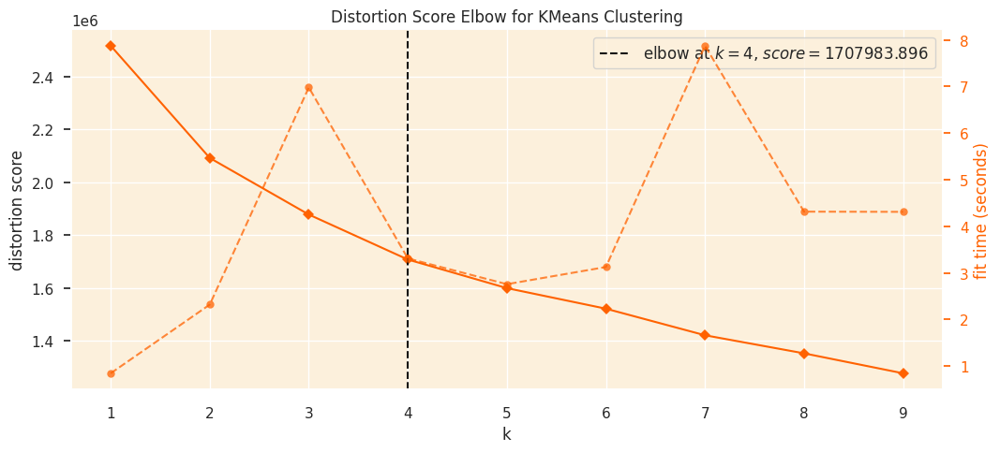

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from pyspark.sql import DataFrame

def visualize_elbow_method(pd_kmeans, feature_columns):
    # Select RFM columns for analysis
    pd_kmeans_features = pd_kmeans[feature_columns]

    # Set plot style, and background color
    sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

    # Set the color palette for the plot
    sns.set_palette(['#ff6200'])

    # Standardize the features
    scaler = StandardScaler()
    kmeans_features_scaled = scaler.fit_transform(pd_kmeans_features)

    # Create an instance of the KElbowVisualizer with explicit n_init
    visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(1, 10))

    # Create a figure and axis with the desired size
    fig, ax = plt.subplots(figsize=(12, 5))

    # Adjust the model and the visualizer
    visualizer.fit(kmeans_features_scaled)

    # Suppress FutureWarning
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        visualizer.show()


visualize_elbow_method(pd_kmeans_encoded,km_feature_columns)

#### Entrainement du modele

In [ ]:
def apply_new_labels(dataframe, n_clusters,feature_columns):

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=100, random_state=0)
    new_dataframe= dataframe[feature_columns]
    kmeans.fit(new_dataframe)

    # Get the frequency of each cluster
    cluster_frequencies = Counter(kmeans.labels_)

    # Create a mapping from old labels to new labels based on frequency
    label_mapping = {label: new_label for new_label, (label, _) in enumerate(cluster_frequencies.most_common())}
    cluster_mapping={2: 1, 1: 0, 0: 2}
    # Reverse the mapping to assign labels as per your criteria
    label_mapping = {v: k for k, v in cluster_mapping.items()}

    # Apply the mapping to get the new labels, handling the case where the key is not present
    new_labels = np.array([label_mapping.get(label, label) for label in kmeans.labels_])

    return new_labels

def apply_kmeans_clustering(dataframe, n_clusters, feature_columns=km_feature_columns):
      new_features1=apply_new_labels(dataframe, n_clusters,feature_columns)
      # Create a new dataframe with the cluster labels
      clustered_dataframe = dataframe.copy()  # Use .copy() to avoid unintended modifications
      clustered_dataframe['cluster'] = new_features1
      return clustered_dataframe

def apply_kmeans_clustering2(dataframe,dataframe2, n_clusters, feature_columns=km_feature_columns):
      new_features2=apply_new_labels(dataframe, n_clusters,  feature_columns)
      # Create a new dataframe with the cluster labels
      clustered_dataframe2= dataframe2.copy()  # Use .copy() to avoid unintended modifications
      clustered_dataframe2['cluster'] = new_features2
      return clustered_dataframe2

num_clusters=5
#Sans normalisation:
pd_segment_valeur = apply_kmeans_clustering(pd_kmeans_encoded, num_clusters)

#Normalisation
pd_segment_valeur_scaled= apply_kmeans_clustering(pd_kmeans_scaled, num_clusters)
pd_segment_valeur_scaled2 = apply_kmeans_clustering2(pd_kmeans_scaled,pd_kmeans_encoded, num_clusters)

#PCA
pd_segment_valeur_pca = apply_kmeans_clustering(pd_kmeans_pca,num_clusters,feature_columns= pca_columns)
pd_segment_valeur_pca2 = apply_kmeans_clustering2(pd_kmeans_pca,pd_kmeans_encoded,num_clusters,feature_columns= pca_columns)

#PCA et normalisation
pd_segment_valeur_scaled_pca = apply_kmeans_clustering(pd_kmeans_scaled_pca, num_clusters, feature_columns=pca_columns)
pd_segment_valeur_scaled_pca2 = apply_kmeans_clustering2(pd_kmeans_scaled_pca,pd_kmeans_encoded, num_clusters, feature_columns=pca_columns)

In [ ]:
pd_segment_valeur_scaled_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,cluster
0,-321593.771997,-1.148136,0.213181,-0.024086,-0.020775,0.111495,4
1,-321593.771997,-1.140975,0.215562,-0.025678,-0.036240,0.134278,4
2,-321255.771998,-2.241845,-0.782855,-0.122194,1.682835,-0.555750,4
3,-321255.771997,-2.031317,-0.712849,-0.169002,1.228157,0.114064,4
4,-320886.771997,0.569550,-0.052573,-0.084192,0.809168,0.391353,4


#### Métrique d'évaluation

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

def compute_clustering_metrics(dataframe,columns_to_drop=['cluster', 'ville']):
    """
    Compute clustering metrics for a given dataframe with cluster labels.

    Parameters:
    - dataframe: The input dataframe with cluster labels.

    Returns:
    - None (prints the metrics table).
    """
    # Compute number of customers
    num_observations = len(dataframe)

    # Separate the features and the cluster labels
    X = dataframe.drop(columns_to_drop, axis=1)
    clusters = dataframe['cluster']

    # Compute the metrics
    sil_score = silhouette_score(X, clusters)
    # calinski_score = calinski_harabasz_score(X, clusters)
    davies_score = davies_bouldin_score(X, clusters)

    # Create a table to display the metrics and the number of observations
    table_data = [
        # ["Nombre d'observations", num_observations],
        ["Silhouette Score", sil_score],
        # ["Calinski Harabasz Score", calinski_score],
        ["Davies Bouldin Score", davies_score]]

    # Print the table
    print(tabulate(table_data, headers=["Métrique", "Valeur"], tablefmt='grid'))

# # Usage example
print("Sans normalisation")
compute_clustering_metrics(pd_segment_valeur)

print("\n\nAvec PCA")
compute_clustering_metrics(pd_segment_valeur_pca,['cluster'])

print("\n\nAvec normalisation")
compute_clustering_metrics(pd_segment_valeur_scaled)

print("\n\nAvec normalisation et PCA")
compute_clustering_metrics(pd_segment_valeur_scaled_pca,['cluster'])

Sans normalisation
+----------------------+----------+
| Métrique             |   Valeur |
+======================+==========+
| Silhouette Score     | 0.562494 |
+----------------------+----------+
| Davies Bouldin Score | 0.684599 |
+----------------------+----------+


Avec PCA
+----------------------+----------+
| Métrique             |   Valeur |
+======================+==========+
| Silhouette Score     | 0.479188 |
+----------------------+----------+
| Davies Bouldin Score | 0.707237 |
+----------------------+----------+


Avec normalisation
+----------------------+------------+
| Métrique             |     Valeur |
+======================+============+
| Silhouette Score     |  -0.188372 |
+----------------------+------------+
| Davies Bouldin Score | 262.009    |
+----------------------+------------+


Avec normalisation et PCA
+----------------------+----------+
| Métrique             |   Valeur |
+======================+==========+
| Silhouette Score     | 0.561974 |
+------

####  Profilage  (Tendances centrales)

##### Approche Radar

Sans normalisation


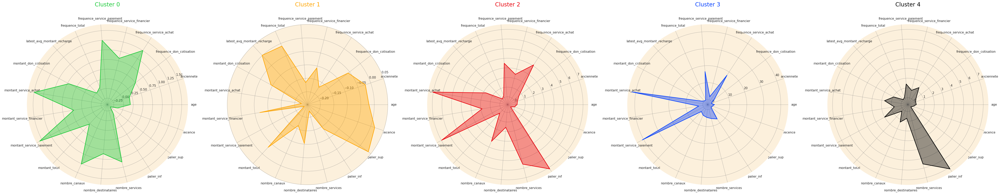



Avec PCA


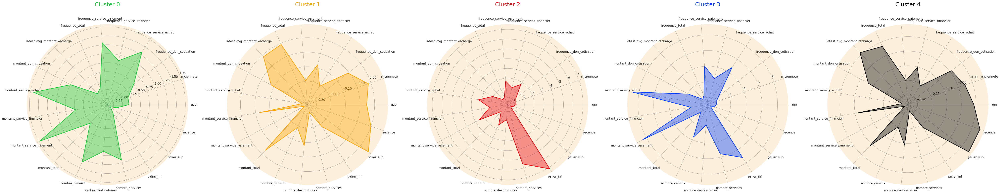



Avec normalisation


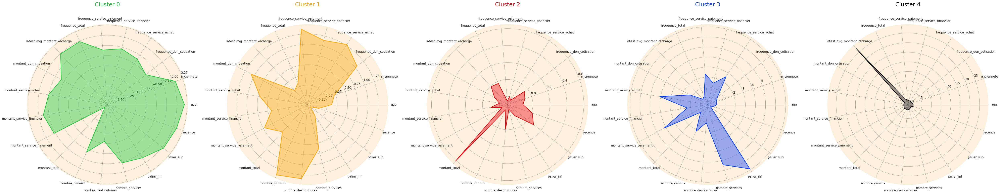



Avec normalisation et PCA


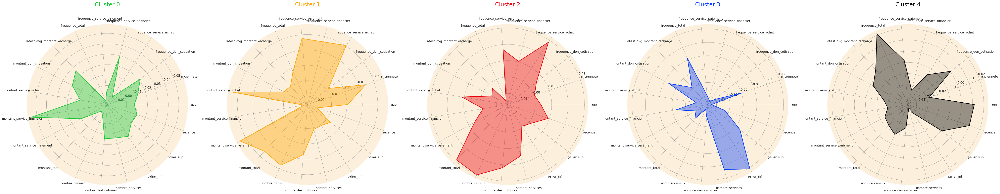

In [ ]:
def plot_radar_chart(dataframe):
    """
    Plot radar charts for each cluster using the centroid values.

    Parameters:
    - dataframe: The input dataframe with cluster labels.
    - colors: List of colors for the clusters.

    Returns:
    - None (displays the radar charts).
    """

    new_columns=dataframe.columns.difference(['ville'])
    new_dataframe= dataframe[new_columns]
    # Set 'CustomerID' column as index and assign it to a new dataframe
    df_customer = new_dataframe.set_index('numero')

    colors=[ '#1ac938','orange', '#e8000b', '#023eff', 'black']  # Add a color for the 5th cluster

    # Standardize the data (excluding the cluster column)
    scaler = StandardScaler()
    df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

    # Create a new dataframe with standardized values and add the cluster column back
    df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
    df_customer_standardized['cluster'] = df_customer['cluster']

    # Calculate the centroids of each cluster
    cluster_centroids = df_customer_standardized.groupby('cluster').mean()

    # Function to create a radar chart
    def create_radar_chart(ax, angles, data, color, cluster):
        # Plot the data and fill the area
        ax.fill(angles, data, color=color, alpha=0.4)
        ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')

        # Add a title
        ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

    # Set data
    labels = np.array(cluster_centroids.columns)
    num_vars = len(labels)

    # Compute angle of each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # The plot is circular, so we need to "complete the loop" and append the start to the end
    labels = np.concatenate((labels, [labels[0]]))
    angles += angles[:1]

    # Get the number of clusters dynamically
    num_clusters = len(cluster_centroids)

    # Initialize the figure
    fig, ax = plt.subplots(figsize=(50, 30), subplot_kw=dict(polar=True), nrows=1, ncols=num_clusters)

    # Create radar chart for each cluster
    for i, color in enumerate(colors[:num_clusters]):  # Use only the required number of colors
        data = cluster_centroids.loc[i].tolist()
        data += data[:1]  # Complete the loop
        create_radar_chart(ax[i], angles, data, color, i)

    # Add input data
    for a in ax:
        a.set_xticks(angles[:-1])
        a.set_xticklabels(labels[:-1])

    # Add a grid
    for a in ax:
        a.grid(color='grey', linewidth=0.5)

    # Display the plot
    plt.tight_layout()
    plt.show()

# Usage example
print("Sans normalisation")
plot_radar_chart(pd_segment_valeur)

print("\n\nAvec PCA")
plot_radar_chart(pd_segment_valeur_pca2)

print("\n\nAvec normalisation")
plot_radar_chart(pd_segment_valeur_scaled2)

print("\n\nAvec normalisation et PCA")
plot_radar_chart(pd_segment_valeur_scaled_pca2)

##### Approche Histogramme



Avec normalisation


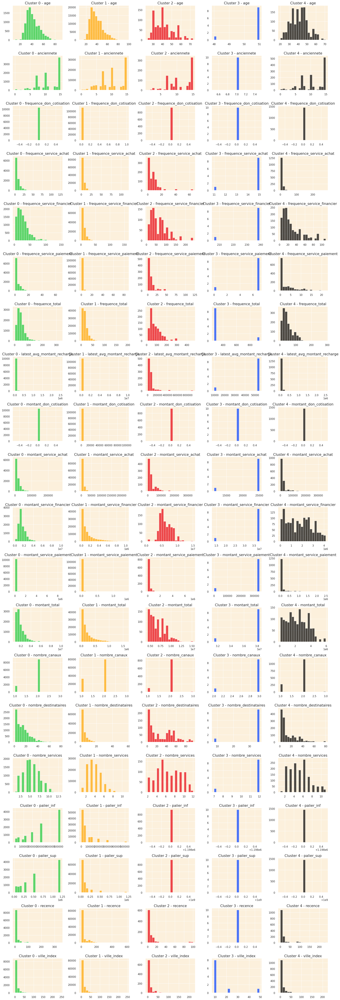

In [ ]:
def plot_cluster_histograms(data, feature_columns):
    """
    Plot histograms for each feature segmented by the clusters.

    Parameters:
    - data: DataFrame containing the data.
    - feature_columns: List of feature column names.
    - cluster_column: Name of the column containing cluster labels.
    - bins: Number of bins for the histograms.
    - colors: List of colors for each cluster.

    Returns:
    - None
    """

    colors=[ '#1ac938','orange', '#e8000b', '#023eff', 'black']
    cluster_column='cluster'
    clusters = data[cluster_column].unique()
    clusters.sort()

    # Setting up the subplots
    n_rows = len(feature_columns)
    n_cols = len(clusters)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3 * n_rows))

    # Plotting histograms
    for i, feature in enumerate(feature_columns):
        for j, cluster in enumerate(clusters):
            cluster_data = data[data[cluster_column] == cluster][feature]
            axes[i, j].hist(cluster_data, bins=20, color=colors[j], edgecolor='w', alpha=0.7)
            axes[i, j].set_title(f'Cluster {cluster} - {feature}', fontsize=15)
            axes[i, j].set_xlabel('')
            axes[i, j].set_ylabel('')

    # Adjusting layout to prevent overlapping
    plt.tight_layout()
    plt.show()

# print("Sans normalisation")
# plot_cluster_histograms(pd_segment_valeur, km_feature_columns)

print("\n\nAvec normalisation")
plot_cluster_histograms(pd_segment_valeur, km_feature_columns)

# print("\n\nAvec PCA")
# plot_cluster_histograms(pd_segment_valeur_pca, km_feature_columns)

# print("\n\nAvec normalisation et PCA")
# plot_cluster_histograms(pd_segment_valeur_scaled_pca, km_feature_columns)


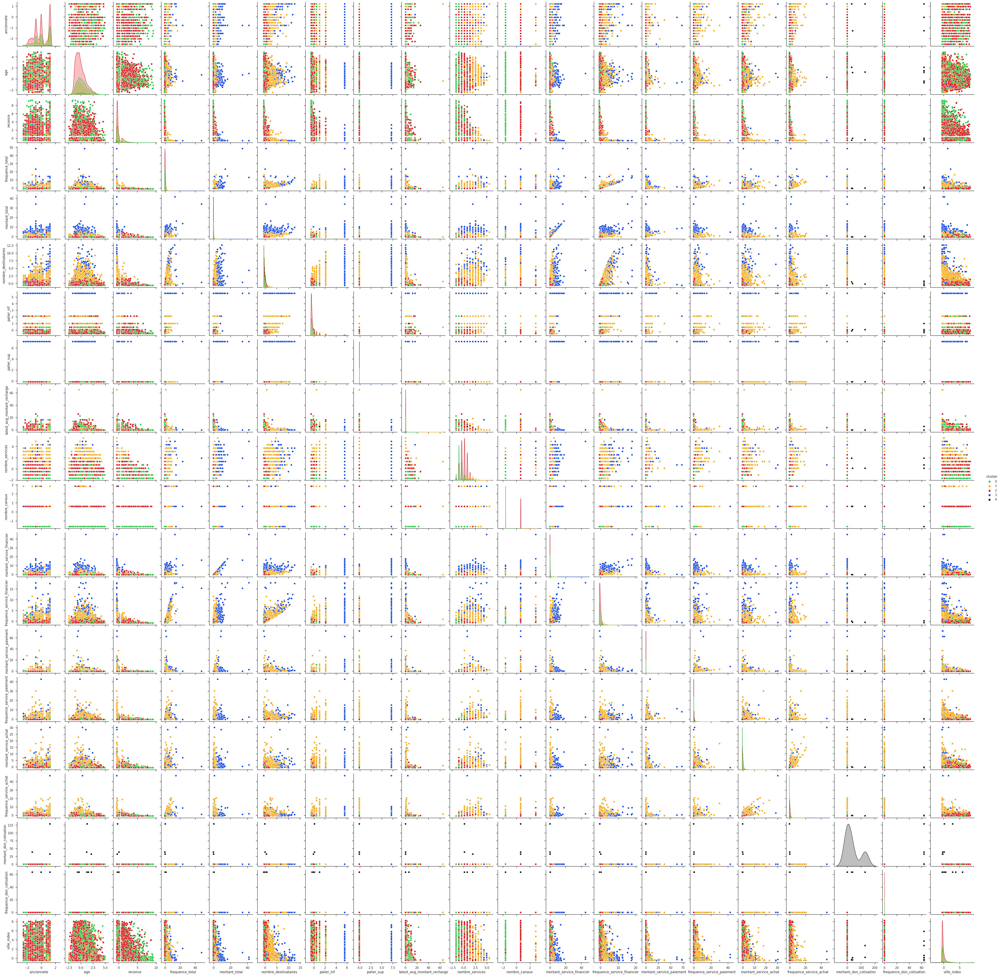

In [ ]:
def plot_pairplot(dataframe):
  # Définir la palette de couleurs
  pal=[ '#1ac938','orange', '#e8000b', '#023eff', 'black']
  # Créer le pairplot en utilisant la palette de couleurs
  sns.set(style="ticks")
  sns.pairplot(dataframe, hue="cluster", palette=pal)
  # Afficher le pairplot
  plt.show()

plot_pairplot(pd_segment_valeur_scaled)

##### Profils

- **Cluster 0**:
1.Montant_service_achat, montant_service_paiement, nombre_service, frequence_service, frequence_servie_achat
- **Cluster 1**:
1.Palier_sup

2.Lastest_avg_montant_recharge, frequence_total, montant_total, recence, anciennete

3.Frequence_service_financier
- **Cluster 2**
1.Palier_inf, montant_service_paiement, montant_service_achat

2.Frequence_service_achat,frequence_service_paiement,nombre_services,montant_service_paiement,montant_service_acaht

- **Cluster 3**
1.Montant_service_achat, montant_service_paiement

3.Frequence_service_paiement, frequence_service_achat

- **Cluster 4**
1.Palier_inf

2.Nombre_services

In [ ]:
def profiler_segmented_dataframe(original_dataframe, segment_labels):
    # Créer une copie du DataFrame existant
    df_final = original_dataframe.copy()

    # Ajouter la colonne 'segment' avec les valeurs correspondantes
    df_final['segment'] = df_final['cluster'].map(segment_labels).fillna('Autre')

    return df_final

# Définir les libellés de segment dans un dictionnaire
# segment_labels1 = {
#     0: 'Fidèle et engagé',
#     1: 'Client à gros transferts',
#     2: 'Actif et polyservice',
#     3: 'Gros rechargeur urbain',
#     4: 'Champion'
# }

segment_labels2 = {
    0: 'Polyvalent ',
    1: 'Client valeureux et rechargeur',
    2: 'Dépensier',
    3: 'Acheteur de produits Orange et payeur de factures',
    4: 'Utilisateur modéré'
}

# Utiliser la fonction pour créer le nouveau DataFrame
pd_segment_valeur_final = profiler_segmented_dataframe(pd_segment_valeur, segment_labels2)

# # Display the filtered DataFrame
pd_segment_valeur_final.head()

,numero,anciennete,age,ville,recence,frequence_total,montant_total,nombre_destinataires,palier_inf,palier_sup,...,frequence_service_financier,montant_service_paiement,frequence_service_paiement,montant_service_achat,frequence_service_achat,montant_don_cotisation,frequence_don_cotisation,ville_index,cluster,segment
0,1000001,14,33,PIKINE,92,9,58650.0,1,50000.0,80000.0,...,5,0.0,0,8150.0,4,0.0,0,8.0,1,Client valeureux et rechargeur
1,1000001,14,33,PARCELLES ASSAINIES,92,9,58650.0,1,50000.0,80000.0,...,5,0.0,0,8150.0,4,0.0,0,3.0,1,Client valeureux et rechargeur
2,1000339,4,30,MABO,2,4,51050.0,1,15000.0,29000.0,...,4,0.0,0,0.0,0,0.0,0,159.0,1,Client valeureux et rechargeur
3,1000339,4,30,MBOUR,2,4,51050.0,1,15000.0,29000.0,...,4,0.0,0,0.0,0,0.0,0,12.0,1,Client valeureux et rechargeur
4,1000708,7,35,THIES,24,28,598916.0,3,300000.0,520000.0,...,15,36441.0,1,3300.0,1,0.0,0,5.0,1,Client valeureux et rechargeur


#### Visualisation des segments

##### Description des clusters

In [ ]:
import pandas as pd

tableau = {
    'Clusters': [0,1,2,3,4],

    'Profils': [
    'Polyvalent ',
     'Client valeureux et rechargeur',
    'Dépensier',
     'Acheteur de produits Orange et payeur de factures',
     'Utilisateur modéré'
],

    'Activités': [

            ]
}

df = pd.DataFrame(tableau)

# Centrer le texte dans la colonne 'Activité' et changer la couleur en bleu et blanc
def highlight_text(text):
    return f'text-align: center;'

styled_df = df.style.applymap(highlight_text)

# Add borders between columns
styled_df.set_properties(**{
    'border': '1px solid white',
    'border-collapse': 'collapse',
    'text-align': 'center'
})


ValueError: ignored

In [ ]:
import pandas as pd

tableau = {
    'Clusters': [0, 1, 2, 3, 4],

    'Profils': [
        'Polyvalent',
        'Client valeureux et rechargeur',
        'Dépensier',
        'Acheteur de produits Orange et payeur de factures',
        'Utilisateur modéré'
    ],

    'Activités': [
        'Actifs impliqués dans une variété d\'activités, avec un accent particulier sur les achats fréquents.',
        'Gèrent leurs finances avec prudence, effectuent des transactions étendues et sont actifs dans les recharges.',
        'Dépensent de manière significative, en particulier dans des services financiers variés.',
        'Concentrés sur l\'achat de produits Orange et le paiement de factures.',
        'Utilisateurs financièrement modérés avec des transactions économiques.'
    ]
}

df = pd.DataFrame(tableau)

# Centrer le texte dans la colonne 'Activité' et changer la couleur en bleu et blanc
def highlight_text(text):
    return f'text-align: center;'

styled_df = df.style.applymap(highlight_text)

# Add borders between columns
styled_df.set_properties(**{
    'border': '1px solid white',
    'border-collapse': 'collapse',
    'text-align': 'center'
})


##### Répartion des clients

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_segment_distribution_by_customer(dataframe, segment_column):
    # Create a countplot with a custom color palette
    fig, ax = plt.subplots(1, 1, figsize=(20, 8))
    sns.set(style="whitegrid")

    custom_palette =['#1ac938', 'orange', '#e8000b', '#023eff', 'black']

    sns.countplot(x=segment_column, data=dataframe, palette=custom_palette)

    # Calculate the total number of customers
    total_count = len(dataframe)

    # Annotate bars with percentages
    for p in ax.patches:
        percentage = '{:.2f}%'.format(100 * p.get_height() / total_count)
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

    # Modify the ylabel and title
    ax.set_ylabel('Nombre de clients')
    ax.set_title('Distribution des clients par segment')

    # Rotate x-axis labels by 45 degrees
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    # Increase font size
    ax.tick_params(axis='both', labelsize=14)

    plt.show()

# Example usage:
# Assuming pd_rfm_segments is your DataFrame and 'segment_RFM' is the segment column
# Replace these values with your actual DataFrame and column names
plot_segment_distribution_by_customer(pd_segment_valeur_final, 'segment')


In [ ]:
pd_segment_valeur_final.info()

##### Répartition du chiffre d'affaires

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_distribution_by_segment(dataframe, x_column, y_column):
    # Group by the specified segment column and calculate total revenue
    grouped_data = dataframe.groupby(x_column)[y_column].sum().reset_index()

    # Calculate the percentage of revenue for each segment
    total_revenue = grouped_data[y_column].sum()
    grouped_data['Percentage_Revenue'] = (grouped_data[y_column] / total_revenue) * 100

    # Create a diverse color palette
    diverse_palette = sns.color_palette("husl", n_colors=len(grouped_data))

    # Create a bar plot using the diverse color palette
    fig, ax = plt.subplots(figsize=(20, 9))
    ax.bar(grouped_data.index, grouped_data['Percentage_Revenue'], color=diverse_palette)
    ax.set_xlabel('Segments')
    ax.set_ylabel(f'Pourcentage du revenu')
    ax.set_title('Pourcentage du revenu par segment')

    # Customize x-axis labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xticks(grouped_data.index)
    ax.set_xticklabels(grouped_data[x_column])

    # Annotate bars with percentages
    for i, percentage in enumerate(grouped_data['Percentage_Revenue']):
        ax.annotate(f'{percentage:.2f}%', (grouped_data.index[i], percentage), ha='center', va='bottom')

    plt.show()

# Example usage:
# Assuming pd_rfm_segments is your DataFrame, 'segment_RFM' is the segment column, and 'montant' is the revenue column
# Replace these values with your actual DataFrame and column names
plot_distribution_by_segment(pd_segment_valeur_final, 'segment','montant_total')


In [ ]:
plot_distribution_by_segment(pd_segment_valeur_final, 'segment','frequence_total')

#### Répartition par ancienneté/age

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_age_distribution_by_rfm_segment(dataframe, segment_column, age_column):
    # Create a new 'AgeGroup' column to group customers by 10-year age brackets
    dataframe['AgeGroup'] = (dataframe[age_column] // 10) * 10

    # Group the data by RFM segment and age group, then calculate percentages by multiplying by 100
    grouped_data = dataframe.groupby([segment_column, 'AgeGroup']).size().unstack().div(dataframe.groupby(segment_column).size(), axis=0) * 100

    # Retrieve age group labels
    age_labels = [f'{i}' for i in range(10, 100, 10)]

    # Add '%' sign to annotations
    annot_data = grouped_data.applymap(lambda x: f'{x:.0f}%')

    # Display the distribution table with percentages in percentage (%)
    plt.figure(figsize=(14, 8))
    sns.heatmap(grouped_data, annot=annot_data, cmap='YlGnBu', cbar=False, fmt='', linewidths=1, linecolor='black')
    plt.title("Customer Distribution by RFM Segment and Age Group (in percentage)")
    plt.xlabel("Age Group")
    plt.ylabel("RFM Segment")

    # Move age group labels to the center
    plt.xticks(range(len(age_labels)), age_labels, rotation=0)

    # Move age group labels 0.5 units down
    plt.yticks(range(len(grouped_data.index)), grouped_data.index, va="center")

    plt.show()

# Example usage:
# Assuming pd_rfm_joined is your DataFrame, 'segment_RFM' is the segment column, and 'age' is the age column
# Replace these values with your actual DataFrame and column names
plot_age_distribution_by_rfm_segment(pd_segment_valeur_final, 'segment', 'age')


In [ ]:
plot_age_distribution_by_rfm_segment(pd_segment_valeur_final, 'segment', 'anciennete')

### **Modèle 2 (MLLIB)**

#### Nombre de clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

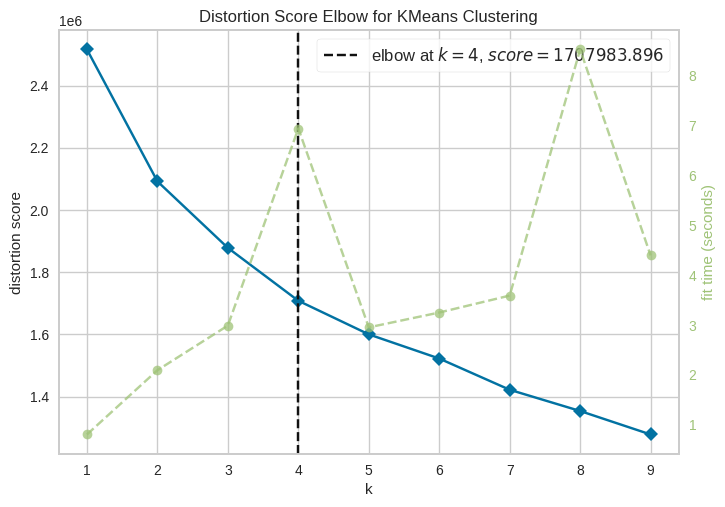

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from pyspark.sql import DataFrame

def visualize_elbow(pd_kmeans, feature_columns):
    # Sélectionner les colonnes RFM pour l'analyse

    kmeans_features = pd_kmeans[feature_columns]

    # Standardisation des caractéristiques
    scaler = StandardScaler()
    kmeans_features_scaled = scaler.fit_transform(kmeans_features)

    # Créer une instance du KElbowVisualizer
    visualizer = KElbowVisualizer(KMeans(random_state=42), k=(1, 10))

    # Ajuster le modèle et le visualizer
    visualizer.fit(kmeans_features_scaled)

    # Suppress FutureWarning
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        visualizer.show()

# Exemple d'utilisation
visualize_elbow(pd_kmeans_encoded, km_feature_columns)

#### Entrainement

In [ ]:
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.clustering import KMeans
from pyspark.sql import SparkSession

def df_kmeans_model_train_save(df, feature_columns: list, optimal_k: int, model_path: str):

    # Assemble the features into a single vector column
    assembler = VectorAssembler(inputCols=feature_columns, outputCol="raw_features")
    df_kmeans = assembler.transform(df)

    # Initialize the StandardScaler
    scaler = StandardScaler(inputCol="raw_features", outputCol="features", withStd=True, withMean=True)

    # Fit and transform the data using the scaler
    scaler_model = scaler.fit(df_kmeans)
    df_kmeans_scaled = scaler_model.transform(df_kmeans)

    # Initialize the K-Means model
    kmeans = KMeans().setK(optimal_k).setSeed(1).setFeaturesCol("features")

    # Fit the K-Means model to the data
    model = kmeans.fit(df_kmeans_scaled)

    # Save the K-Means model to the specified path
    model.write().overwrite().save(model_path)

    return model



In [ ]:
def df_kmeans_model_load(df, feature_columns, model_path):

    # Assemble les caractéristiques en une seule colonne de vecteurs
    assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")
    df_kmeans = assembler.transform(df)

    # Charge le modèle K-Means sauvegardé
    model = KMeansModel.load(model_path)

    # Effectue la transformation des données
    clustered_df = model.transform(df_kmeans)

    # Renomme la colonne "prediction" en "Cluster" et supprime la colonne "features"
    clustered_df = clustered_df.withColumnRenamed("prediction", "cluster").drop("features")

    return clustered_df


In [ ]:
model_path = "#models_OM/model_OM_Kmeans"  # Chemin de sauvegarde du modèle
optimal_k = 5  # Nombre optimal de clusters
df_kmeans_model_train_save(df_kmeans_created, km_feature_columns, optimal_k, model_path)

KMeansModel: uid=KMeans_ff4bce79a871, k=5, distanceMeasure=euclidean, numFeatures=20

In [ ]:
model_path = "#models_OM/model_OM_Kmeans"
df_segment_valeur_kmeans = df_kmeans_model_load(df_kmeans_created, km_feature_columns, model_path)
pd_segment_valeur_kmeans=df_segment_valeur_kmeans.toPandas()
df_segment_valeur_kmeans.printSchema()

root
 |-- numero: string (nullable = true)
 |-- anciennete: integer (nullable = true)
 |-- age: integer (nullable = true)
 |-- recence: integer (nullable = true)
 |-- frequence_total: long (nullable = false)
 |-- montant_total: double (nullable = true)
 |-- nombre_destinataires: long (nullable = false)
 |-- palier_inf: double (nullable = true)
 |-- palier_sup: double (nullable = true)
 |-- latest_avg_montant_recharge: double (nullable = true)
 |-- nombre_services: integer (nullable = false)
 |-- nombre_canaux: integer (nullable = false)
 |-- montant_service_financier: double (nullable = true)
 |-- frequence_service_financier: long (nullable = true)
 |-- montant_paiement: double (nullable = true)
 |-- frequence_paiement: long (nullable = true)
 |-- montant_achat: double (nullable = true)
 |-- frequence_achat: long (nullable = true)
 |-- montant_don_cotisation: double (nullable = true)
 |-- frequence_don_cotisation: long (nullable = true)
 |-- ville_index: double (nullable = false)
 |-- 

#### Evaluation

##### Score

In [ ]:
def evaluate_kmeans_model(df_kmeans):
    # df_kmeans2 = df_kmeans.withColumnRenamed("cluster","prediction")

    # Evaluate the model using Silhouette score
    evaluator = ClusteringEvaluator(predictionCol="cluster")
    wssse = evaluator.evaluate(df_kmeans)
    print(f"Within Set Sum of Squared Errors (WSSSE) = {wssse}")

# Call the evaluation function with your DataFrame
evaluate_kmeans_model(df_segment_valeur_kmeans)


##### Silhouette score

In [ ]:
#Importing the model
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

silhouette_score=[]
final_data=df_segment_valeur_kmeans
evaluator = ClusteringEvaluator(predictionCol='prediction',
								featuresCol='scaledFeatures', \
								metricName='silhouette',
								distanceMeasure='squaredEuclidean')

for i in range(2,10):
	kmeans=KMeans(featuresCol='scaledFeatures', k=i)
	model=kmeans.fit(final_data)
	predictions=model.transform(final_data)
	score=evaluator.evaluate(predictions)
	silhouette_score.append(score)
	print('Silhouette Score for k =',i,'is',score)


In [ ]:
#Visualizing the silhouette scores in a plot
import matplotlib.pyplot as plt

plt.plot(range(2,10),silhouette_score)
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Silhouette Score')
plt.show()


##### Visualisation des cluster K-Means

In [ ]:
# Définir la palette de couleurs
cluster_colors = ["green", "yellow", "red"]  # Vous pouvez personnaliser ces couleurs

# Créer le pairplot en utilisant la palette de couleurs
sns.set(style="ticks")
sns.pairplot(pd_segment_valeur_kmeans, hue="Cluster", palette=cluster_colors)

# Afficher le pairplot
plt.show()

#### Profilage des segments

In [ ]:
# df_kmeans =  (df_kmeans
#     .withColumn('Segment',
#         when(col('Cluster')==0, lit('Very High'))
#         .when(col('Cluster')==1, lit('High'))
#         .when(col('Cluster')==2, lit('Medium'))
#          .when(col('Cluster')==3, lit('Low'))
#         .otherwise(lit('Autre'))
#     )
# )

# df_kmeans.filter(col("Segment_service")=="Medium").show()

In [ ]:
pal = ['gold','#cc0000', '#ace600','#33cccc']
plt.figure(figsize=(13,8))
pl = sns.countplot(x=pd_segment_valeur_kmeans['Clusters'], palette= pal)
pl.set_title('Distribution Of The Clusters')
plt.show()

# **TESTS**

---



In [ ]:
# #Importation des CSV
# path='/content/drive/MyDrive/Colab/Segmentation/#datasets_OM'
# file_list=['2022_2.csv', '2022_3.csv','2022_4.csv','2022_5.csv','2022_6.csv','2022_7.csv',  '2022_8.csv', '2022_8.csv','2022_9.csv','2022_10.csv','2022_11.csv','2022_12.csv','2023_1.csv','2023_2.csv','2023_3.csv','2023_4.csv','2023_5.csv','2023_6.csv','2023_7.csv', ]
# df_agg = spark.read.csv(f'{path}/2022_1.csv', header=True)
# for csv_file in file_list:
#   df = spark.read.csv(f'{path}/{csv_file}', header=True, inferSchema=True)
#   df_agg = df_agg.union(df)

# df_agg.write.csv('#datasets_OM/trusted_om.base_transaction.csv', header=True, mode='overwrite')
# # df_agg.toPandas().to_csv('#datasets_OM/trusted_om.transactions.csv', index=False)
# # Show the RFM DataFrame
# df_agg.show()

In [ ]:
#!git clone https://github.com/asish012/dataanalytics.git

In [ ]:
# http://localhost:5000/segment_multiservice?numero_client=1000263&date_debut=2022-01-02&date_fin=2023-08-14

https://teams.microsoft.com/l/meetup-join/19%3ameeting_OTM5MTU4ZjgtZWRhMi00OGNmLThjNWUtODdkODk3MjNjZjNm%40thread.v2/0?context=%7b%22Tid%22%3a%22c1d47378-a976-412f-946f-f443471c31d8%22%2c%22Oid%22%3a%229b159804-21d5-4c36-93b7-035cfb264459%22%7d